In [1]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from plotly.offline import plot
import plotly.graph_objects as go
import plotly.express as px

pd.set_option('display.max_columns', 500)

from sklearn.preprocessing import StandardScaler, RobustScaler


In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_csv('creditcard.csv')

In [4]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [5]:
df.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')

In [6]:
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,3.918649e-15,5.682686e-16,-8.761736e-15,2.811118e-15,-1.552103e-15,2.040130e-15,-1.698953e-15,-1.893285e-16,-3.147640e-15,1.772925e-15,9.289524e-16,-1.803266e-15,1.674888e-15,1.475621e-15,3.501098e-15,1.392460e-15,-7.466538e-16,4.258754e-16,9.019919e-16,5.126845e-16,1.473120e-16,8.042109e-16,5.282512e-16,4.456271e-15,1.426896e-15,1.701640e-15,-3.662252e-16,-1.217809e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,1.088850e+00,1.020713e+00,9.992014e-01,9.952742e-01,9.585956e-01,9.153160e-01,8.762529e-01,8.493371e-01,8.381762e-01,8.140405e-01,7.709250e-01,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,-2.458826e+01,-4.797473e+00,-1.868371e+01,-5.791881e+00,-1.921433e+01,-4.498945e+00,-1.412985e+01,-2.516280e+01,-9.498746e+00,-7.213527e+00,-5.449772e+01,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,-5.354257e-01,-7.624942e-01,-4.055715e-01,-6.485393e-01,-4.255740e-01,-5.828843e-01,-4.680368e-01,-4.837483e-01,-4.988498e-01,-4.562989e-01,-2.117214e-01,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,-9.291738e-02,-3.275735e-02,1.400326e-01,-1.356806e-02,5.060132e-02,4.807155e-02,6.641332e-02,-6.567575e-02,-3.636312e-03,3.734823e-03,-6.248109e-02,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,4.539234e-01,7.395934e-01,6.182380e-01,6.625050e-01,4.931498e-01,6.488208e-01,5.232963e-01,3.996750e-01,5.008067e-01,4.589494e-01,1.330408e-01,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,2.374514e+01,1.201891e+01,7.848392e+00,7.126883e+00,1.052677e+01,8.877742e+00,1.731511e+01,9.253526e+00,5.041069e+00,5.591971e+00,3.942090e+01,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [7]:
df[df.duplicated()]['Class'].value_counts()

0    1062
1      19
Name: Class, dtype: int64

In [8]:
df = df[~df.duplicated()]

In [9]:
len(df)

283726

# Checking for null values in data

In [10]:
# To check, if there any null value present in data
df.isnull().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

# Checking distribution of output_column/ `Class column`

In [11]:
# Checking the 'class' Column as it have most of the value as 0 and a maximum of 1

df['Class'].unique()

array([0, 1], dtype=int64)

In [12]:
df['Class'].value_counts()

0    283253
1       473
Name: Class, dtype: int64

In [13]:
fig = px.histogram(df, x="Class", color="Class")


fig.update_layout(
                    title = {
                               'text': "Class Distribution \n(0: No Fraud || 1: Fraud)", 
                               "x" : 0.5, 
                               "y" : 0.95, 
                               "xanchor":"center", 
                               'yanchor':'top'
                             },
                 
                    xaxis_title = "Class",
                    yaxis_title = 'Count',
        
                    font = dict(
                                family="Courier New, monospace",
                                 size=16,
                                 color="RebeccaPurple" 
                                 )
                  )


fig.show()

In [14]:
print('variables defined as 0 are', round(df['Class'].value_counts()[0]/len(df)*100,2), '%')
print('variables defined as 1 are', round(df['Class'].value_counts()[1]/len(df)*100,2), '%')

variables defined as 0 are 99.83 %
variables defined as 1 are 0.17 %


In [15]:
fig = go.Figure()

fig.add_trace(go.Pie(labels = ['0: Non fraud', '1: fraud'],
                     values = df['Class'].value_counts(),
                     #name = "Unigram",
                     hole = 0.6,
                     marker_colors = px.colors.cyclical.Edge
                    ))

fig.update_layout(
    title={'text': 'Data Distribution', 'y':0.9, 'x':0.475, 'xanchor': 'center', 'yanchor': 'top'},
    annotations = [dict(text = "Yes vs No",
                      x = 0.5,
                      y = 0.5,
                      font_size = 32,
                      showarrow = False)],

    legend_title="Class",
    font=dict(
        #family="Courier New, monospace",
        size=18,
        color="black"
              )
                  )

fig.show()

Class is Highly Imbalace

# Doing Numerical Analysis on `Time` & `Amount` columns

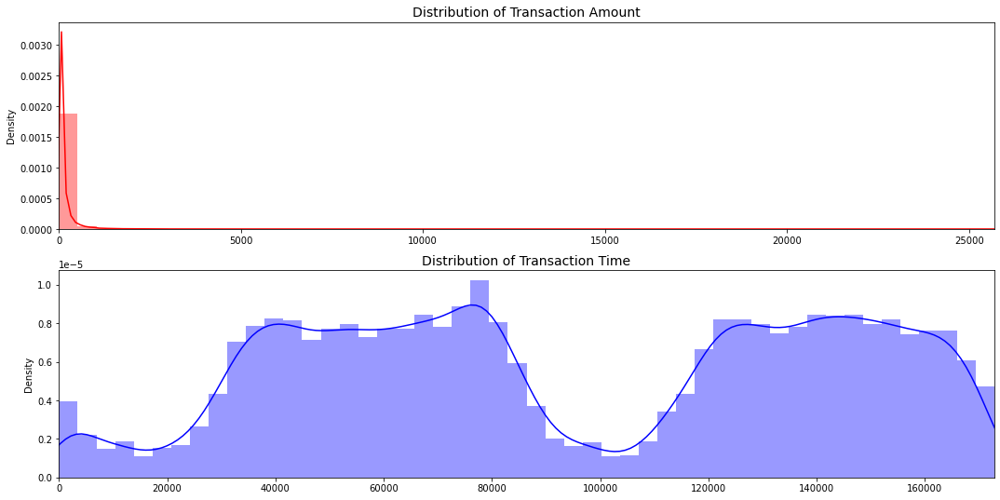

In [16]:
fig, ax = plt.subplots(2, 1, figsize=(18,9))

amount_val = df['Amount'].values
time_val = df['Time'].values

sns.distplot(amount_val, ax=ax[0], color='r')
ax[0].set_title('Distribution of Transaction Amount', fontsize=14)
ax[0].set_xlim([min(amount_val), max(amount_val)])

sns.distplot(time_val, ax=ax[1], color='b')
ax[1].set_title('Distribution of Transaction Time', fontsize=14)
ax[1].set_xlim([min(time_val), max(time_val)])



plt.show()

In [17]:
df['Amount'].skew()

16.978803370060476

For `Amount`, the distribution looks highly skewed and `Time` shows no trend.

# Correlation Matrix

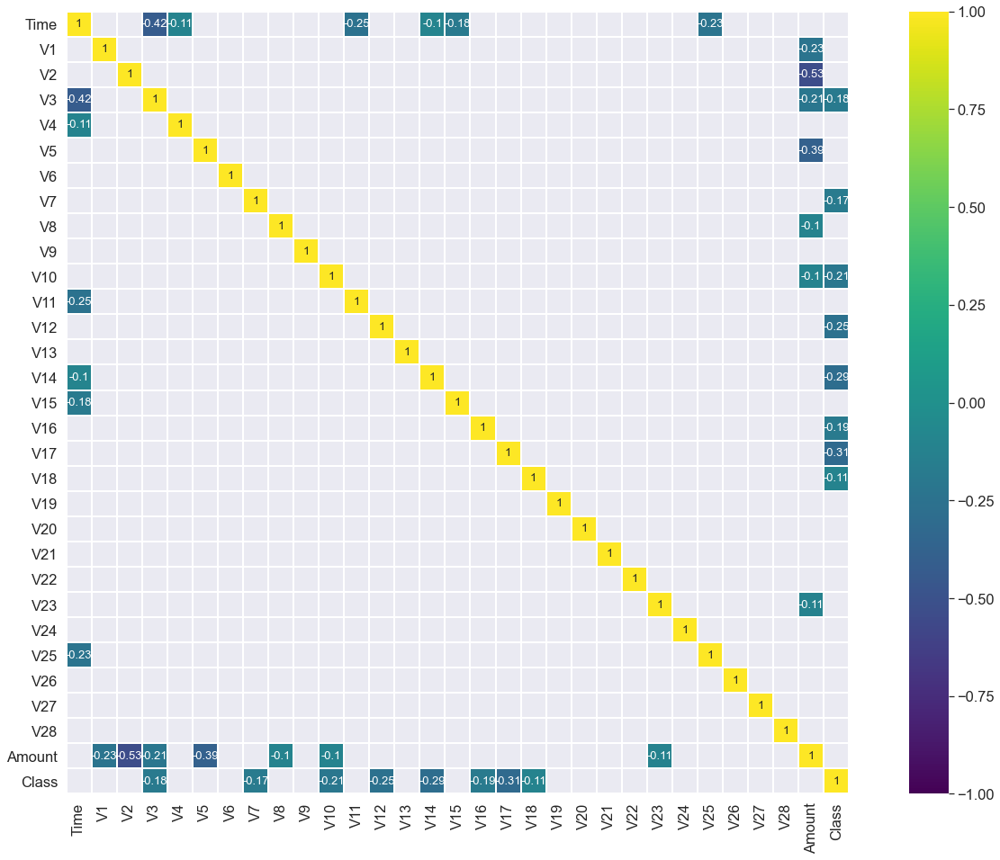

In [18]:
# naive way 
corr = df.corr()
sns.set(font_scale=1.5)
# corr
plt.figure(figsize=(24,16))


sns.heatmap(corr[(corr >= 0.5)| (corr <= -0.1)],
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths = 1,
            annot=True, annot_kws={"size": 13}, square=True);

In [19]:
df_num_corr = df.corr()['Class'][:-1]
best_features_list = df_num_corr[abs(df_num_corr) > 0.4].sort_values(ascending=False)

print("There are {} strongly correlated values with Class column:\n{}".format(len(best_features_list), best_features_list))

There are 0 strongly correlated values with Class column:
Series([], Name: Class, dtype: float64)


In [20]:
df_num_corr = df.corr()['Amount'][:-1]
best_features_list = df_num_corr[abs(df_num_corr) > 0.4].sort_values(ascending=False)

print("There are {} strongly correlated values with Amount:\n{}".format(len(best_features_list), best_features_list))

There are 3 strongly correlated values with Amount:
Amount    1.000000
V7        0.400408
V2       -0.533428
Name: Amount, dtype: float64


# Binary class Analysis

In [21]:
# Creating fraudulent dataframe
data_fraud = df[df['Class'] == 1]
# Creating non fraudulent dataframe
data_non_fraud = df[df['Class'] == 0]

### Class vs Time (Fraud vs Non Fraud)

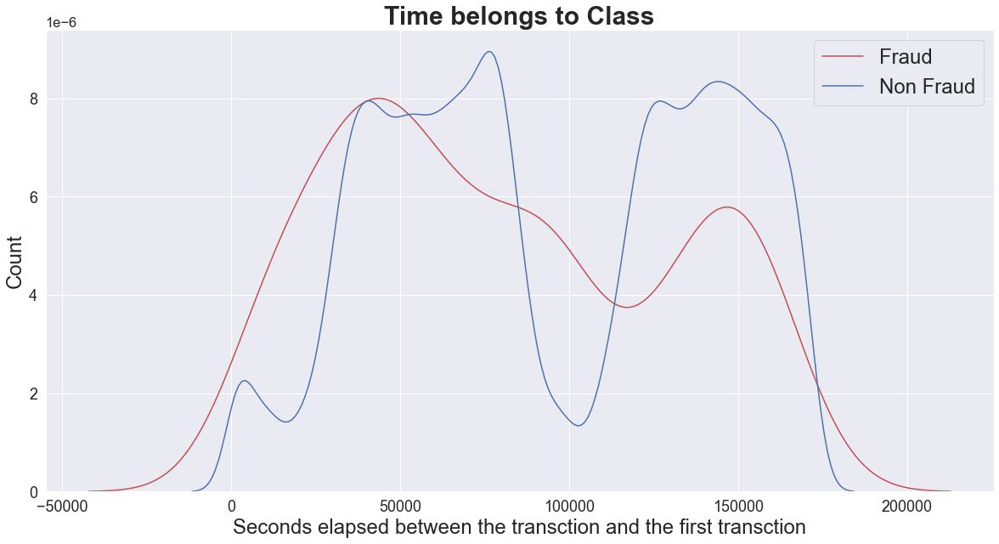

In [22]:
# Distribution plot
plt.figure(figsize=(20,10))

ax = sns.distplot(data_fraud['Time'],color='r', label='Fraud', hist=False);
ax = sns.distplot(data_non_fraud['Time'], color ='b', label='Non Fraud', hist=False);

ax.set_title('Time belongs to Class', fontweight = 'bold', size =30 )
ax.set_ylabel('Count', fontsize = 24) # Y label
ax.set_xlabel('Amount', fontsize = 24) # X label
ax.tick_params(axis = 'both', which = 'major', labelsize = 18)
ax.set(xlabel='Seconds elapsed between the transction and the first transction')
ax.legend(loc="upper right", frameon=True, fontsize=24)
plt.show()

**Distribution is Random as it shows no trend**

### Class vs Amount (Fraud vs Non Fraud)

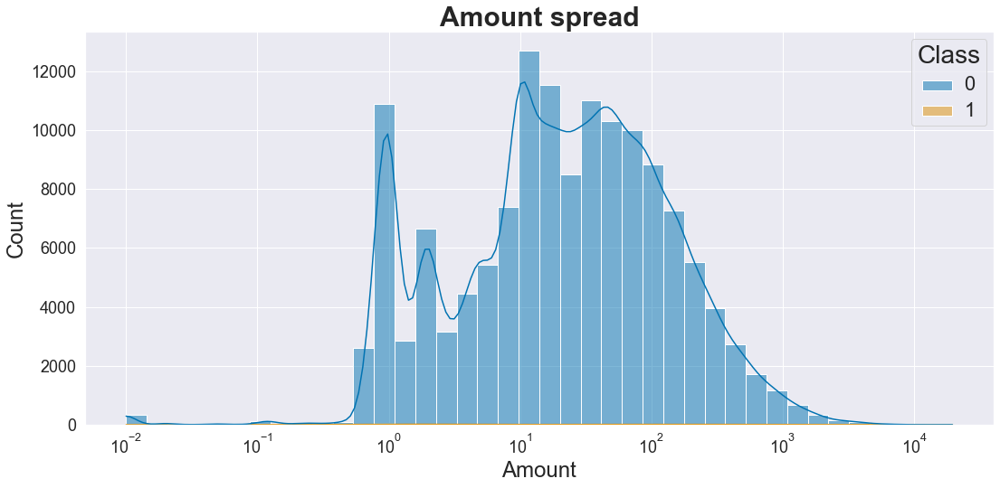

In [23]:
sns.set_palette("colorblind")

sample_df = df[df["Amount"] > 0].sample(frac=0.5);
plt.figure(figsize=[18,8])
ax = sns.histplot( data=sample_df, x="Amount", hue="Class", kde=True, log_scale=True, bins=40);

ax.set_title('Amount spread', fontweight = 'bold', size =30 )
ax.set_ylabel('Count', fontsize = 24) # Y label
ax.set_xlabel('Amount', fontsize = 24) # X label
ax.tick_params(axis = 'both', which = 'major', labelsize = 18)
ax.set(xlabel='Amount')

plt.setp(ax.get_legend().get_texts(), fontsize='22') # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='28') # for legend title

plt.show()

**number of fraud cases are too low than non fraud cases**

### Trying Different plots to Check if there patter present or not.

In [24]:
sample_df_class_0 = df[(df["Amount"] > 0) & (df['Class'] == 0)]
sample_df_class_1 = df[(df["Amount"] > 0) & (df['Class'] == 1)]

#### Histplot (Non Fraud vs Fraud)

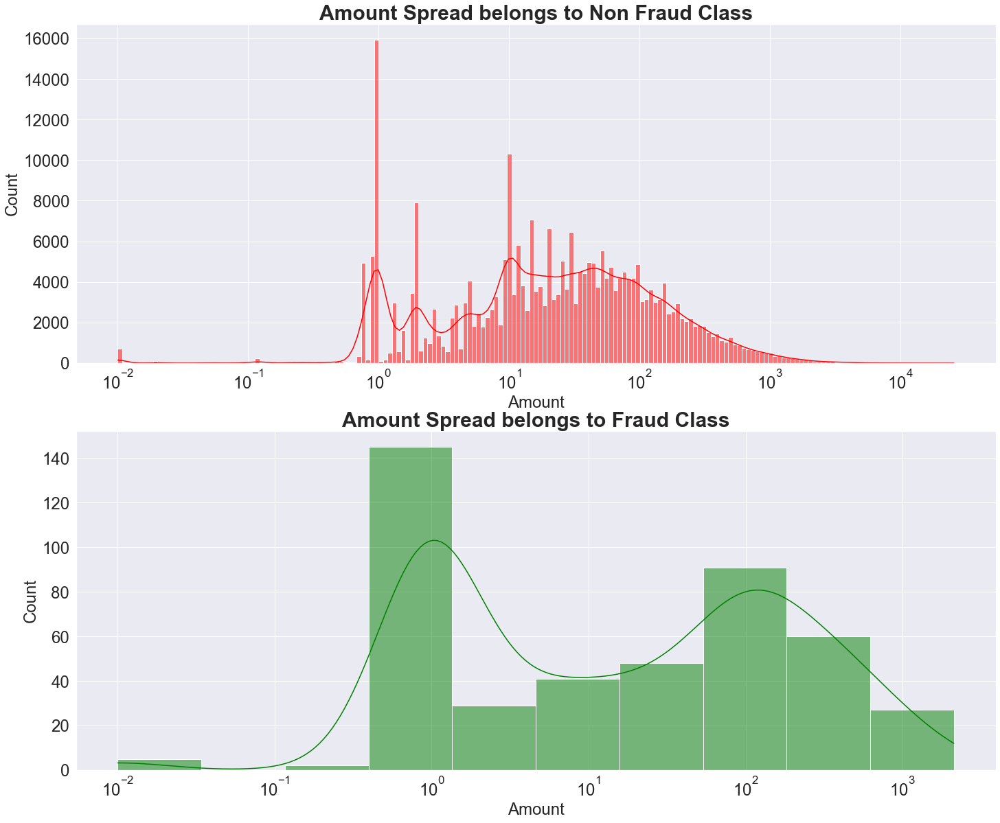

In [25]:
fig, ax = plt.subplots(2, 1, figsize=(24,20))

# For Class == 0
ax[0].set_title('Amount Spread belongs to Non Fraud Class', fontweight = 'bold', size =30 )
ax[0].set_ylabel('Count', fontsize = 24) # Y label
ax[0].set_xlabel('Amount', fontsize = 24) # X label
ax[0].tick_params(axis = 'both', which = 'major', labelsize = 24)
sns.histplot(data=sample_df_class_0,color = ['red'], ax=ax[0], x="Amount", kde=True, log_scale=True);

# For Class == 1
ax[1].set_title('Amount Spread belongs to Fraud Class', fontweight = 'bold', size =30)
ax[1].set_ylabel('Count', fontsize = 24) # Y label
ax[1].set_xlabel('Amount', fontsize = 24) # X label
ax[1].tick_params(axis = 'both', which = 'major', labelsize = 24)
sns.histplot(data=sample_df_class_1,color = ['green'], ax=ax[1], x="Amount",  kde=True, log_scale=True);

#### Kdeplot (Non Fraud vs Fraud)

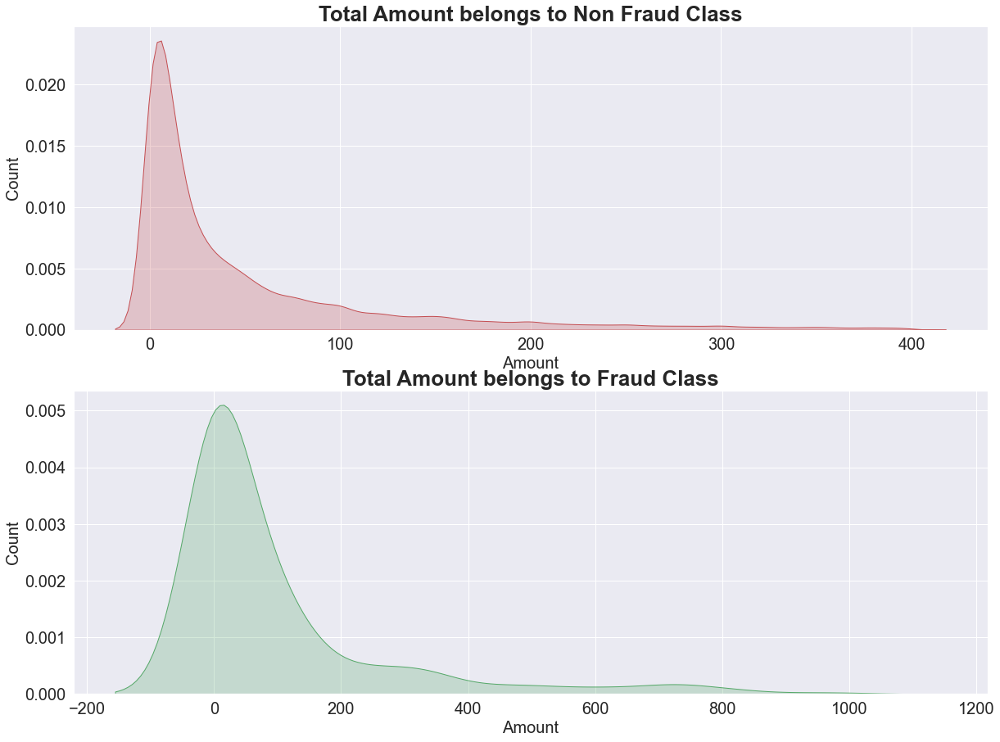

In [26]:
# Limiting Range to get better view over value trend.
sample_df_class_0 = df[df['Amount'].between(-250,400, inclusive=False) & (df['Class'] == 0)]
sample_df_class_1 = df[df['Amount'].between(-250, 1000, inclusive=False) & (df['Class'] == 1)]

fig, ax = plt.subplots(2, 1, figsize=(20,15))
sns.set_style("whitegrid")

ax[0].set_title('Total Amount belongs to Non Fraud Class', fontweight = 'bold', size =26)
ax[0].set_ylabel('Count', fontsize = 20) # Y label
ax[0].set_xlabel('Amount', fontsize = 20) # X label
ax[0].tick_params(axis = 'both', which = 'major', labelsize = 20)
sns.kdeplot(data=sample_df_class_0["Amount"],color ='r', ax = ax[0], shade=True)



ax[1].set_title('Total Amount belongs to Fraud Class', fontweight = 'bold', size =26)
ax[1].set_ylabel('Count', fontsize = 20) # Y label
ax[1].set_xlabel('Amount', fontsize = 20) # X label
ax[1].tick_params(axis = 'both', which = 'major', labelsize = 20)
sns.kdeplot(data=sample_df_class_1["Amount"],color ='g', ax = ax[1], shade=True)


plt.show()



Distribution is skewed towards right in both cases

# Trimming data

In [27]:
# Dropping Time Column

df.drop('Time', axis=1, inplace=True)

The `time` column should be dropped since it does not give useful information.

Checking for duplicate data again after removing the `time` Column:

In [28]:
df[df.duplicated()]['Class'].value_counts()

0    8063
Name: Class, dtype: int64

These 8063 duplicate data are all related to `non fraudolent transactions`. **We can drop them**

In [29]:
df = df[~df.duplicated()]

In [30]:
df.shape

(275663, 30)

In [31]:
# Creating fraudulent dataframe
df_class_1 = df[df['Class'] == 1]
# Creating non fraudulent dataframe
df_class_0 = df[df['Class'] == 0]

In [32]:
df_class_0["Amount"].max()

25691.16

In [33]:
df_class_1["Amount"].max()

2125.87

In [34]:
df_class_0 = df[df['Amount'].between(-1,2500, inclusive=False) & (df['Class'] == 0)]

In [35]:
df_class_0["Amount"].max()

2499.9

In [36]:
new_df = df[df['Amount'].between(-1,2500, inclusive=False)]

In [37]:
new_df.shape

(275217, 30)

In [38]:
df_class_1.shape

(473, 30)

In [39]:
df.head(7)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
5,-0.425966,0.960523,1.141109,-0.168252,0.420987,-0.029728,0.476201,0.260314,-0.568671,-0.371407,1.341262,0.359894,-0.358091,-0.137134,0.517617,0.401726,-0.058133,0.068653,-0.033194,0.084968,-0.208254,-0.559825,-0.026398,-0.371427,-0.232794,0.105915,0.253844,0.081080,3.67,0
6,1.229658,0.141004,0.045371,1.202613,0.191881,0.272708,-0.005159,0.081213,0.464960,-0.099254,-1.416907,-0.153826,-0.751063,0.167372,0.050144,-0.443587,0.002821,-0.611987,-0.045575,-0.219633,-0.167716,-0.270710,-0.154104,-0.780055,0.750137,-0.257237,0.034507,0.005168,4.99,0


In [40]:
df['Amount'].skew()

16.841622118790013

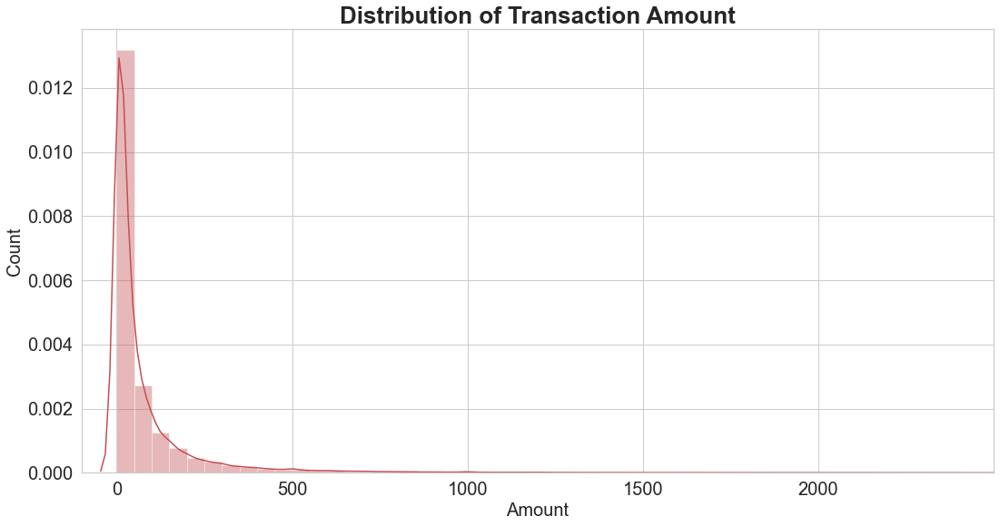

In [41]:
fig, ax = plt.subplots(1, 1, figsize=(18,9))
sns.set_style("whitegrid")

amount_val = new_df['Amount'].values

sns.distplot(amount_val, ax=ax, color='r')
ax.set_title('Distribution of Transaction Amount', fontweight = 'bold', size =26)

ax.set_xlim([-100, max(amount_val)])

ax.set_ylabel('Count', fontsize = 20) # Y label
ax.set_xlabel('Amount', fontsize = 20) # X label
ax.tick_params(axis = 'both', which = 'major', labelsize = 20)



'''sns.distplot(time_val, ax=ax[1], color='b')
ax[1].set_title('Distribution of Transaction Time', fontsize=14)
ax[1].set_xlim([min(time_val), max(time_val)])
'''


plt.show()

In [42]:
new_df['Amount'].skew()

5.407765831113532

In [43]:
df['Amount'].skew()

16.841622118790013

In [44]:
new_df.shape

(275217, 30)

In [45]:
df.shape

(275663, 30)

In [46]:
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax

df['Amount_bc'] = boxcox1p(df['Amount'], boxcox_normmax(df['Amount'] + 1))

In [47]:
new_df['Amount_bc'] = boxcox1p(new_df['Amount'], boxcox_normmax(new_df['Amount'] + 1))

In [48]:
def num_plot(df, col, title):
    fig, ax = plt.subplots(2, 1, sharex=True, figsize=(9,5),gridspec_kw={"height_ratios": (.2, .8)})
    
    #ax[0].set_title(title,fontsize=18)
    ax[0].set_title('Distribution of Transaction Amount', fontweight = 'bold', size =16)
    sns.boxplot(x=col, data=df, ax=ax[0])
    ax[0].set(yticks=[])
    ax[0].tick_params(axis = 'both', which = 'major', labelsize = 20)
    

    #ax.set_xlim([-100, max(amount_val)])
    

    
    sns.histplot(x=col, data=df, ax=ax[1])
    ax[1].set_xlabel(col, fontsize=16)
    
    ax[1].set_ylabel('Count', fontsize = 16) # Y label
    ax[1].set_xlabel('Amount', fontsize = 16) # X label
    ax[1].tick_params(axis = 'both', which = 'major', labelsize = 14)
    
    plt.axvline(df[col].mean(), color='darkgreen', linewidth=2.2, label='mean=' + str(np.round(df[col].mean(),1)))
    plt.axvline(df[col].median(), color='red', linewidth=2.2, label='median='+ str(np.round(df[col].median(),1)))
    plt.axvline(df[col].mode()[0], color='purple', linewidth=2.2, label='mode='+ str(np.round(df[col].mode()[0],1)))
    plt.legend(bbox_to_anchor=(1, 1.03), ncol=1, fontsize=17, fancybox=True, shadow=True, frameon=True)
    
    plt.tight_layout()
    plt.show()

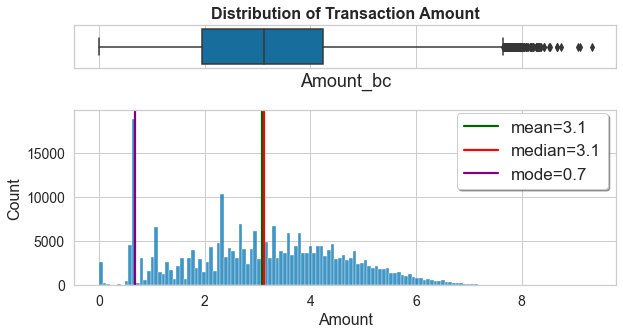

In [49]:
num_plot(df,'Amount_bc', 'Box Cox transform on Amount')

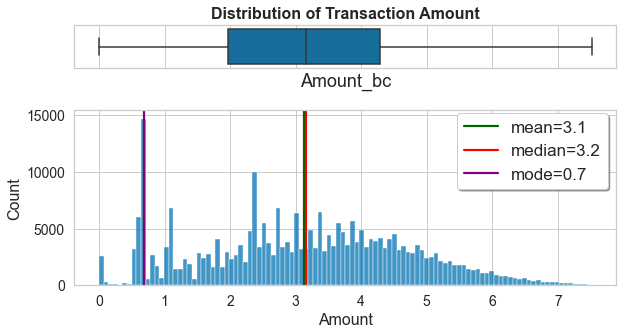

In [50]:
num_plot(new_df,'Amount_bc', 'Box Cox transform on Amount')

The Column removal helped us to decrease skewness significantly from **16.84% to 5.40%**. So we going to work with `new_df` as it shows less skewness from previous dataframe 

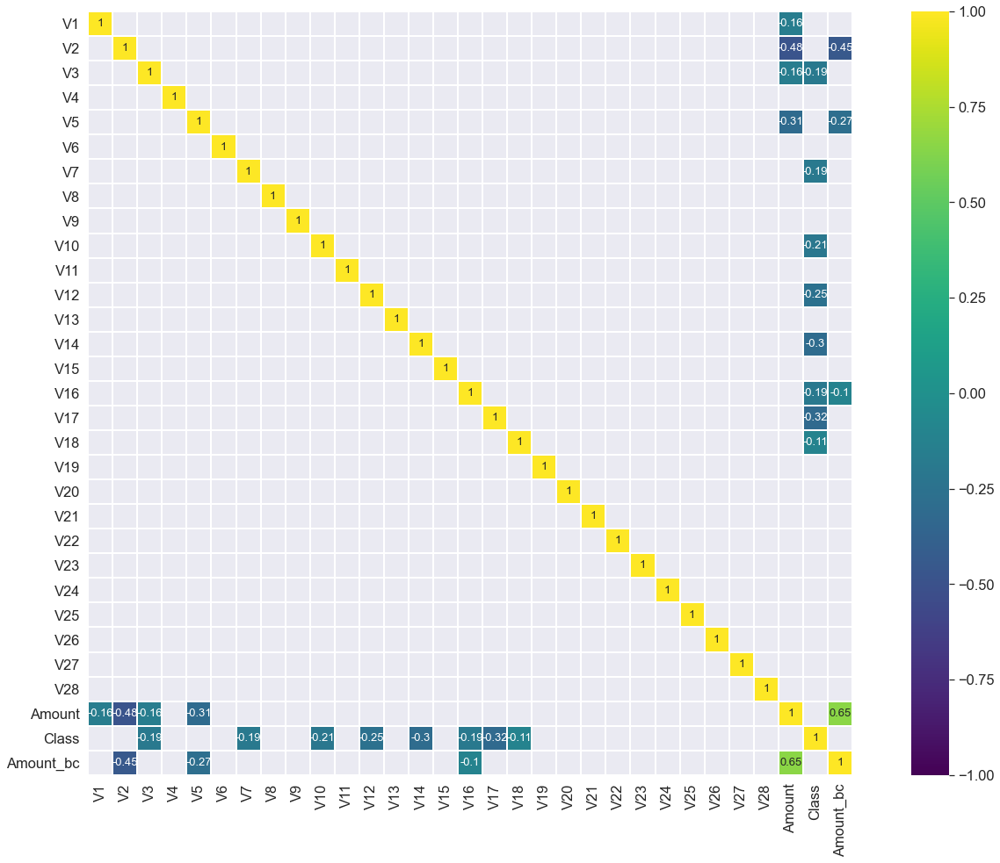

In [51]:
# naive way 
corr = new_df.corr()
sns.set(font_scale=1.5)
# corr
plt.figure(figsize=(24,16))


sns.heatmap(corr[(corr >= 0.5)| (corr <= -0.1)],
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths = 1,
            annot=True, annot_kws={"size": 13}, square=True);

In [52]:
df_num_corr = new_df.corr()['Class'][:-1]
best_features_list = df_num_corr[abs(df_num_corr) > 0.4].sort_values(ascending=False)

print("There are {} strongly correlated values with Class column:\n{}".format(len(best_features_list), best_features_list))

There are 1 strongly correlated values with Class column:
Class    1.0
Name: Class, dtype: float64


In [53]:
df_num_corr = new_df.corr()['Amount'][:-1]
best_features_list = df_num_corr[abs(df_num_corr) > 0.4].sort_values(ascending=False)

print("There are {} strongly correlated values with Amount:\n{}".format(len(best_features_list), best_features_list))

There are 2 strongly correlated values with Amount:
Amount    1.000000
V2       -0.483769
Name: Amount, dtype: float64


In [54]:
df_num_corr = new_df.corr()['Amount_bc'][:-1]
best_features_list = df_num_corr[abs(df_num_corr) > 0.4].sort_values(ascending=False)

print("There are {} strongly correlated values with Amount_bc:\n{}".format(len(best_features_list), best_features_list))

There are 2 strongly correlated values with Amount_bc:
Amount    0.652039
V2       -0.452589
Name: Amount_bc, dtype: float64


In [55]:
new_df.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class,Amount_bc
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0,4.887317
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0,1.296877
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0,5.761072
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0,4.706282
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0,4.170225


There is no visible serious corelation left in data. 

# Scaling the Data

In [56]:
# RobustScaler is less prone to outliers.
rob_scaler = RobustScaler()

new_df['robust_amount'] = rob_scaler.fit_transform(new_df['Amount'].values.reshape(-1,1))

new_df['robust_amount_bc'] = rob_scaler.fit_transform(new_df['Amount_bc'].values.reshape(-1,1))

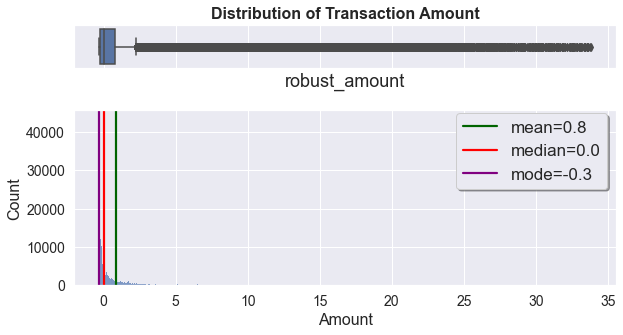

In [57]:
num_plot(new_df,'robust_amount', 'Box Cox transform on Amount')

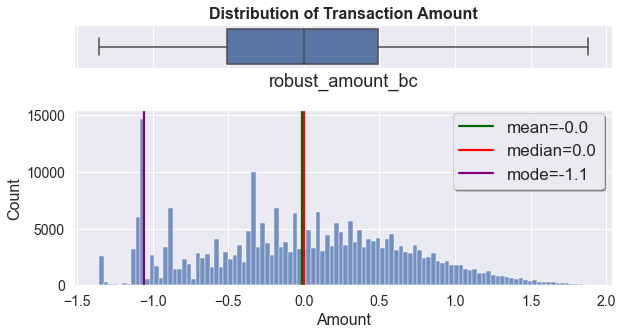

In [58]:
num_plot(new_df,'robust_amount_bc', 'Box Cox transform on Amount')

In [59]:
new_df.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class,Amount_bc,robust_amount,robust_amount_bc
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0,4.887317,1.722055,0.747033
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0,1.296877,-0.285734,-0.797221
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0,5.761072,4.851872,1.122837
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0,4.706282,1.365127,0.669170
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0,4.170225,0.633916,0.438611


In [60]:
scaled_amount = new_df['robust_amount_bc']

new_df.drop(['Amount', 'Amount_bc', 'robust_amount', 'robust_amount_bc'], axis=1, inplace=True)
new_df.insert(0, 'scaled_amount', scaled_amount)
#df.insert(1, 'scaled_time', scaled_time)

# Amount and Time are Scaled!

new_df.head()

,scaled_amount,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Class
0,0.747033,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,0
1,-0.797221,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,0
2,1.122837,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,0
3,0.669170,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0
4,0.438611,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,0


# Spliting the Data

In [61]:
X = new_df.drop("Class", axis=1)
y = new_df.Class

# Dimensionality reduction by PCA

In [62]:
from sklearn.decomposition import PCA
pca = PCA()
pca.fit_transform(X);

Now we can obtain the cumulative explained variance ratios and the number of principal components

In [63]:
cum_sum = np.cumsum(pca.explained_variance_ratio_)*100
comp= [n for n in range(len(cum_sum))]

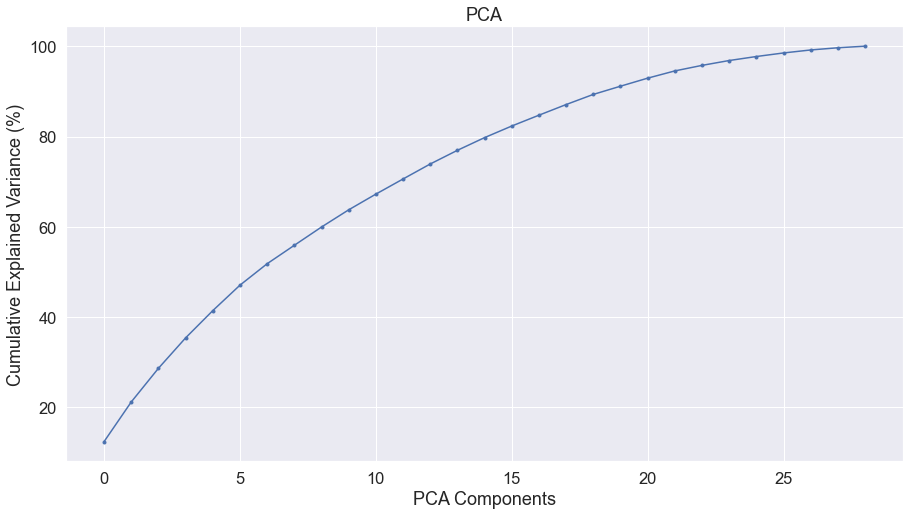

In [64]:
plt.figure(figsize=(15,8))
plt.plot(comp, cum_sum, marker='.')
plt.xlabel('PCA Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.title('PCA')
plt.show()

**It looks like the model have 99% of the explainability**. 


Usually we can keep most of the explainability removing more features, however in this dataset the features appears to be already transformed by PCA.


For this reason we won't drop any features and keep the original 28 columns in the X variable.

# Splitting the Data into Train and Test dataset

In [65]:
# Import library
from sklearn.model_selection import train_test_split

# Splitting data into train and test set 80:20
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, test_size=0.2, random_state=100)

In [66]:
X_train.head()

,scaled_amount,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28
73979,0.414794,1.236809,-1.551907,0.036274,-1.222784,0.458597,4.519633,-2.092671,1.235343,0.725153,0.234813,-1.074612,-0.161282,-0.064476,-1.378978,-1.651102,0.692241,0.558239,-1.034756,1.496297,0.271441,0.073644,0.351358,-0.184818,1.082532,0.646356,-0.036647,0.081867,0.030488
28870,-0.179660,1.218304,-0.562970,0.389771,-1.121415,-0.349010,0.857467,-0.793497,0.353335,1.763607,-1.019807,0.192466,1.285504,0.267895,-0.178681,0.466944,-0.338102,-0.466063,0.538112,1.121504,-0.068184,-0.050020,0.153866,-0.204241,-1.280061,0.605888,-0.588646,0.108490,0.010479
144625,0.158140,-1.613869,0.955951,0.446070,-0.184743,1.592427,4.383889,-0.607320,1.088353,0.472681,0.288374,-0.659215,-0.026511,0.001075,-0.416499,0.609817,0.005395,-0.460524,0.597259,1.050046,-0.095528,0.041922,-0.035550,-0.191071,1.008256,0.024465,-0.428378,-1.063510,-0.106542
165571,0.381840,-1.128741,-0.021499,0.379247,-2.860579,0.609126,-0.942868,0.584560,-0.213662,-1.267449,0.283077,0.370345,-0.434137,0.025085,-0.120656,-1.302426,1.669899,-0.816974,-0.634474,-0.364765,-0.134284,0.435138,1.291758,-0.684909,-0.421749,0.571710,-0.086103,0.129146,0.111863
201753,0.466670,-0.533859,0.069811,-1.014335,-2.262329,-1.989195,-0.236395,-1.470425,1.093245,-2.045071,0.667275,-2.263480,-0.938572,1.012135,0.241913,0.417952,0.565782,0.295074,0.596541,0.238733,-0.767185,-0.192080,-0.558175,0.439164,-1.079018,-0.983801,-0.478685,-0.470309,-0.275949


In [67]:
# Instantiate the Scaler
scaler = StandardScaler()

In [68]:
# Fit the data into scaler and transform
X_train['scaled_amount'] = scaler.fit_transform(X_train[['scaled_amount']])

##### Scaling the test set

In [69]:
# Transform the test set
X_test['scaled_amount'] = scaler.transform(X_test[['scaled_amount']])
X_test.head()

,scaled_amount,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28
23464,-0.874238,1.596412,-0.838118,0.133854,-1.538057,-1.011147,-0.522304,-0.842742,-0.275693,-2.000540,1.404881,-0.986081,-0.404725,2.052802,-0.640077,0.472040,-0.224801,0.123799,0.056170,0.064260,-0.229330,-0.258511,-0.256858,-0.078229,-0.440050,0.549995,-0.157974,0.039781,0.013961
117702,0.337283,1.307266,-0.308641,0.243309,0.012721,-0.241405,0.434254,-0.478046,0.018865,-1.254764,0.883345,0.169277,0.998171,2.006945,-0.093601,0.258801,-0.602380,-1.120239,1.916363,-0.348696,-0.316142,-0.553139,-1.167963,-0.035013,-1.081806,0.376032,-0.563054,0.060370,0.024763
29641,0.112588,1.228178,-0.503776,0.384284,0.009682,-0.664583,0.084472,-0.444425,0.049908,-1.021550,0.729661,1.116117,1.258997,0.757380,-0.063022,-0.956643,-2.016357,0.318895,0.618493,-0.624039,-0.467026,-0.421169,-0.562772,0.015060,0.053944,0.384580,0.377026,0.008566,0.004343
233271,1.390136,1.662476,-0.868208,-2.051028,0.000255,0.451438,-0.034189,0.362984,-0.196285,0.095222,0.211491,0.306394,0.797242,0.718034,0.502985,0.006767,0.521337,-1.086990,0.511223,0.322925,0.374233,0.345798,0.543700,-0.249454,-0.047795,0.094085,0.760951,-0.140760,-0.040449
60684,0.020309,-0.397555,0.517869,0.802830,-1.447479,-0.367715,-0.433437,-0.100778,0.276699,-1.695747,-0.090945,-1.100368,-0.266360,1.711526,-0.242796,0.446860,1.452596,-0.011030,-1.298696,1.136660,0.175315,-0.059047,-0.441186,-0.026409,-0.577948,-0.005708,-0.499793,-0.090677,-0.048393


## Checking the Skewness

In [70]:
# Listing the columns
cols = X_train.columns
cols

Index(['scaled_amount', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9',
       'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19',
       'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28'],
      dtype='object')

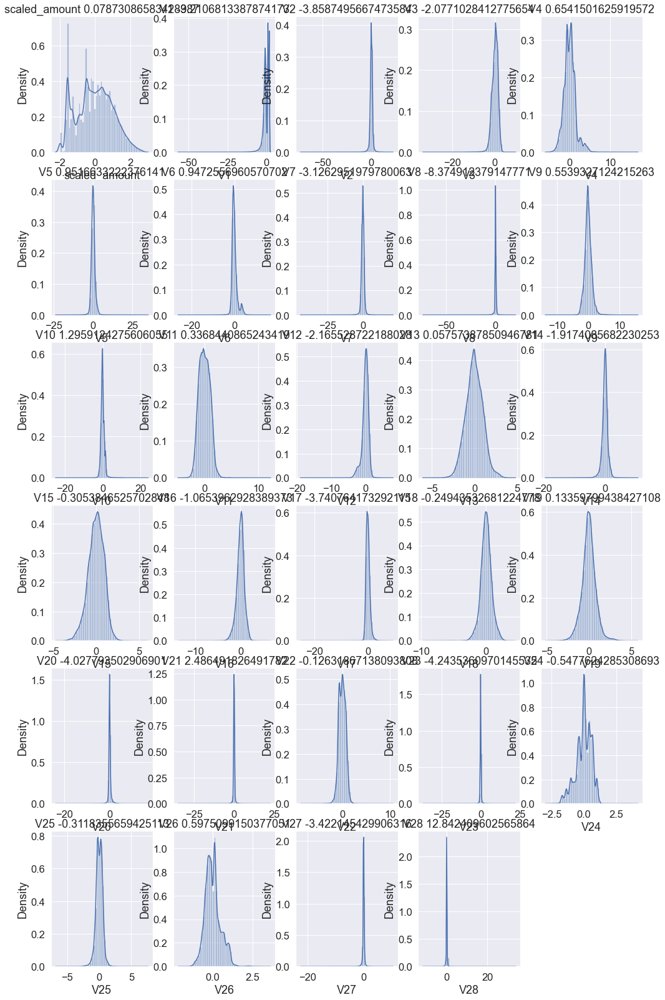

In [71]:
# Plotting the distribution of the variables (skewness) of all the columns
k=0
plt.figure(figsize=(17,28))
for col in cols :    
    k=k+1
    plt.subplot(6, 5,k)    
    sns.distplot(X_train[col])
    plt.title(col+' '+str(X_train[col].skew()))

We see that there are many variables, which are heavily skewed. We will mitigate the skewness only for those variables for bringing them into normal distribution.

### Mitigate skweness with PowerTransformer

In [72]:
# Importing PowerTransformer
from sklearn.preprocessing import PowerTransformer
# Instantiate the powertransformer
pt = PowerTransformer(method='yeo-johnson', standardize=True, copy=False)
# Fit and transform the PT on training data
X_train[cols] = pt.fit_transform(X_train)

In [73]:
# Transform the test set
X_test[cols] = pt.transform(X_test)

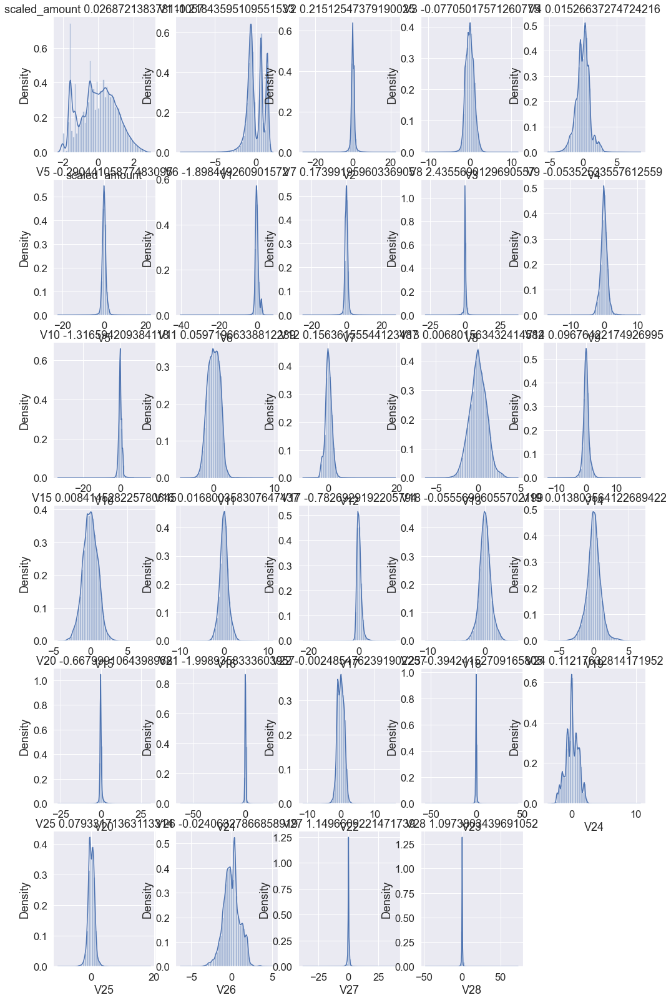

In [74]:
# Plotting the distribution of the variables (skewness) of all the columns
k=0
plt.figure(figsize=(17,28))
for col in cols :    
    k=k+1
    plt.subplot(6, 5,k)    
    sns.distplot(X_train[col])
    plt.title(col+' '+str(X_train[col].skew()))

Now we can see that all the variables are normally distributed after the transformation.

# Model building on imbalanced data

### Metric selection for heavily imbalanced data
As we have seen that the data is heavily imbalanced, where only 0.17% transctions are fraudulent, we should not consider Accuracy as a good measure for evaluating the model. Because in the case of all the datapoints return a particular class(1/0) irrespective of any prediction, still the model will result more than 99% Accuracy.

Hence, we have to measure the ROC-AUC score for fair evaluation of the model. The ROC curve is used to understand the strength of the model by evaluating the performance of the model at all the classification thresholds. The default threshold of 0.5 is not always the ideal threshold to find the best classification label of the test point. Because the ROC curve is measured at all thresholds, the best threshold would be one at which the TPR is high and FPR is low, i.e., misclassifications are low. After determining the optimal threshold, we can calculate the F1 score of the classifier to measure the precision and recall at the selected threshold.

#### Why SVM was not tried for model building and Random Forest was not tried for few cases?
In the dataset we have 284807 datapoints and in the case of Oversampling we would have even more number of datapoints. SVM is not very efficient with large number of datapoints beacuse it takes lot of computational power and resources to make the transformation. When we perform the cross validation with K-Fold for hyperparameter tuning, it takes lot of computational resources and it is very time consuming. Hence, because of the unavailablity of the required resources and time SVM was not tried.

For the same reason Random forest was also not tried for model building in few of the hyperparameter tuning for oversampling technique.

#### Why KNN was not used for model building?
KNN is not memory efficient. It becomes very slow as the number of datapoints increases as the model needs to store all the data points. It is computationally heavy because for a single datapoint the algorithm has to calculate the distance of all the datapoints and find the nearest neighbors.

### Logistic regression

In [75]:
# Importing scikit logistic regression module
from sklearn.linear_model import LogisticRegression

In [76]:
# Impoting metrics
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report

#### Tuning hyperparameter  C
C is the the inverse of regularization strength in Logistic Regression. Higher values of C correspond to less regularization.

In [77]:
# Importing libraries for cross validation
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

In [78]:
# Creating KFold object with 5 splits
folds = KFold(n_splits=5, shuffle=True, random_state=4)

# Specify params
params = {"C": [0.01, 0.1, 1, 10, 100, 1000]}

# Specifing score as recall as we are more focused on acheiving the higher sensitivity than the accuracy
model_cv = GridSearchCV(estimator = LogisticRegression(),
                        param_grid = params, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True) 

# Fit the model
model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:   39.6s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=4, shuffle=True),
             estimator=LogisticRegression(),
             param_grid={'C': [0.01, 0.1, 1, 10, 100, 1000]},
             return_train_score=True, scoring='roc_auc', verbose=1)

In [79]:
# results of grid search CV
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.632727,0.908527,0.059374,0.079919,0.01,{'C': 0.01},0.980957,0.981494,0.991852,0.979697,0.961077,0.979015,0.009969,1,0.979265,0.980138,0.979158,0.981783,0.986169,0.981303,0.002608
1,1.085730,0.078559,0.018749,0.006251,0.1,{'C': 0.1},0.980553,0.979852,0.989490,0.980054,0.955587,0.977107,0.011354,2,0.977831,0.978845,0.978453,0.980573,0.985109,0.980162,0.002635
2,1.188408,0.086733,0.031251,0.024208,1,{'C': 1},0.979659,0.979306,0.988796,0.979245,0.954544,0.976310,0.011476,3,0.977332,0.978232,0.977872,0.979986,0.984396,0.979564,0.002575
3,1.096823,0.058795,0.015624,0.000002,10,{'C': 10},0.979552,0.979231,0.988719,0.979129,0.954423,0.976211,0.011489,4,0.977271,0.978154,0.977794,0.979910,0.984305,0.979487,0.002567
4,1.096822,0.052660,0.021874,0.007655,100,{'C': 100},0.979538,0.979224,0.988710,0.979117,0.954414,0.976201,0.011489,5,0.977266,0.978146,0.977786,0.979902,0.984295,0.979479,0.002566
5,1.074947,0.030294,0.018751,0.006250,1000,{'C': 1000},0.979537,0.979224,0.988710,0.979116,0.954413,0.976200,0.011489,6,0.977265,0.978145,0.977785,0.979902,0.984295,0.979478,0.002566


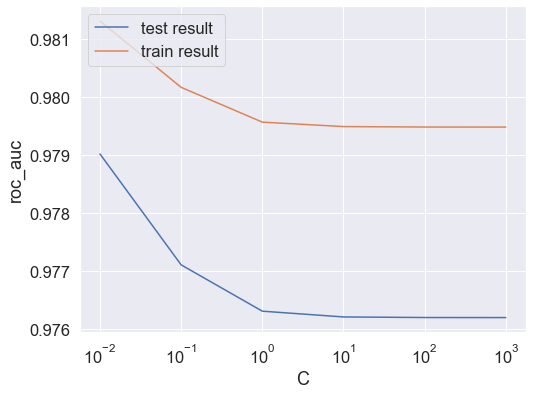

In [80]:
# plot of C versus train and validation scores

plt.figure(figsize=(8, 6))
plt.plot(cv_results['param_C'], cv_results['mean_test_score'])
plt.plot(cv_results['param_C'], cv_results['mean_train_score'])
plt.xlabel('C')
plt.ylabel('roc_auc')
plt.legend(['test result', 'train result'], loc='upper left')
plt.xscale('log')

In [81]:
# Best score with best C
best_score = model_cv.best_score_
best_C = model_cv.best_params_['C']

print(" The highest test roc_auc is {0} at C = {1}".format(best_score, best_C))

 The highest test roc_auc is 0.9790154205555476 at C = 0.01


#### Logistic regression with optimal C

In [82]:
# Instantiate the model with best C
logistic_imb = LogisticRegression(C=0.01)

In [83]:
# Fit the model on the train set
logistic_imb_model = logistic_imb.fit(X_train, y_train)

##### Prediction on the train set

In [84]:
# Predictions on the train set
y_train_pred = logistic_imb_model.predict(X_train)

In [85]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_train, y_train_pred)
print(confusion)

[[219758     30]
 [   151    234]]


In [86]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [87]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_train, y_train_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_train, y_train_pred))

Accuracy:- 0.9991779191817344
Sensitivity:- 0.6077922077922078
Specificity:- 0.999863504831929
F1-Score:- 0.7211093990755008


In [88]:
# classification_report
print(classification_report(y_train, y_train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    219788
           1       0.89      0.61      0.72       385

    accuracy                           1.00    220173
   macro avg       0.94      0.80      0.86    220173
weighted avg       1.00      1.00      1.00    220173



##### ROC on the train set

In [89]:
# ROC Curve function

def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [90]:
# Predicted probability
y_train_pred_proba = logistic_imb_model.predict_proba(X_train)[:,1]

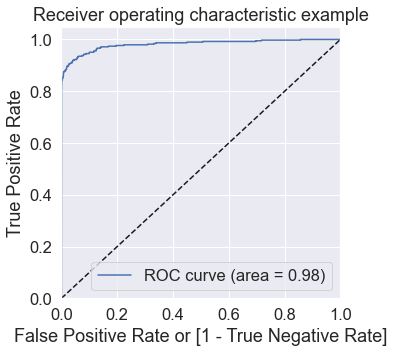

In [91]:
# Plot the ROC curve
draw_roc(y_train, y_train_pred_proba)

We acheived very good ROC 0.99 on the train set.

#### Prediction on the test set

In [92]:
# Prediction on the test set
y_test_pred = logistic_imb_model.predict(X_test)

In [93]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion)

[[54946    10]
 [   31    57]]


In [94]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [95]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_test, y_test_pred))

Accuracy:- 0.9992551413414723
Sensitivity:- 0.6477272727272727
Specificity:- 0.9998180362471796
F1-Score:- 0.7354838709677418


In [96]:
# classification_report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     54956
           1       0.85      0.65      0.74        88

    accuracy                           1.00     55044
   macro avg       0.93      0.82      0.87     55044
weighted avg       1.00      1.00      1.00     55044



##### ROC on the test set

In [97]:
# Predicted probability
y_test_pred_proba = logistic_imb_model.predict_proba(X_test)[:,1]

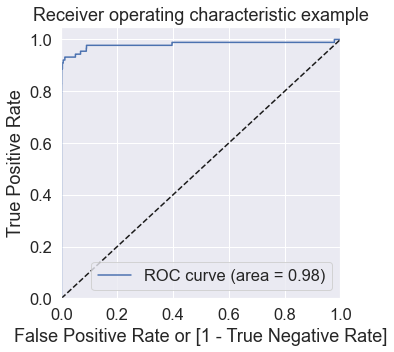

In [98]:
# Plot the ROC curve
draw_roc(y_test, y_test_pred_proba)

We can see that we have very good ROC on the test set 0.98, which is almost close to 1.

***Model summary of Logistic Regression***

- **Train set**
    - Accuracy = 0.999
    - Sensitivity =  0.608
    - Specificity = 0.999
    - F1-Score =  0.721
    - ROC-AUC = 0.98
    
- **Test set**
    - Accuracy = 0.999
    - Sensitivity = 0.648
    - Specificity =  0.999
    - F-1 Score = 0.735
    - ROC-AUC = 0.98

Overall, the model is performing well in the test set, what it had learnt from the train set.

# XGBoost

In [99]:
# Importing XGBoost
from xgboost import XGBClassifier

##### Tuning the hyperparameters

In [100]:
# hyperparameter tuning with XGBoost

# creating a KFold object 
folds = 3

# specify range of hyperparameters
param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]}          


# specify model
xgb_model = XGBClassifier(max_depth=2, n_estimators=200)

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = xgb_model, 
                        param_grid = param_grid, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)      

# fit the model
model_cv.fit(X_train, y_train)       

Fitting 3 folds for each of 6 candidates, totalling 18 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[15:56:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[15:56:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[15:57:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[15:57:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[Parallel(n_jobs=1)]: Done  18 out of  18 | elapsed: 11.3min finished


[16:07:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=2, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=200, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None, va

In [101]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,26.997368,1.100212,0.177075,3.897400e-02,0.2,0.3,"{'learning_rate': 0.2, 'subsample': 0.3}",0.978994,0.962090,0.970550,0.970545,0.006901,4,0.999593,0.999886,0.999891,0.999790,0.000139
1,38.727195,0.436237,0.120493,7.912595e-03,0.2,0.6,"{'learning_rate': 0.2, 'subsample': 0.6}",0.982564,0.976139,0.974138,0.977614,0.003595,2,0.999920,0.999941,0.999970,0.999943,0.000021
2,49.014143,1.108196,0.129002,3.191377e-03,0.2,0.9,"{'learning_rate': 0.2, 'subsample': 0.9}",0.988896,0.974382,0.976271,0.979850,0.006443,1,0.999913,0.999972,0.999913,0.999932,0.000028
3,25.822124,0.831165,0.124994,5.619580e-07,0.6,0.3,"{'learning_rate': 0.6, 'subsample': 0.3}",0.966893,0.967991,0.967036,0.967307,0.000487,6,0.999915,0.999996,0.999983,0.999965,0.000035
4,37.610272,1.388612,0.135410,1.948661e-02,0.6,0.6,"{'learning_rate': 0.6, 'subsample': 0.6}",0.979748,0.957980,0.972565,0.970098,0.009056,5,1.000000,1.000000,1.000000,1.000000,0.000000
5,45.663726,1.056567,0.140619,1.275679e-02,0.6,0.9,"{'learning_rate': 0.6, 'subsample': 0.9}",0.984753,0.975812,0.970497,0.977021,0.005883,3,1.000000,1.000000,1.000000,1.000000,0.000000


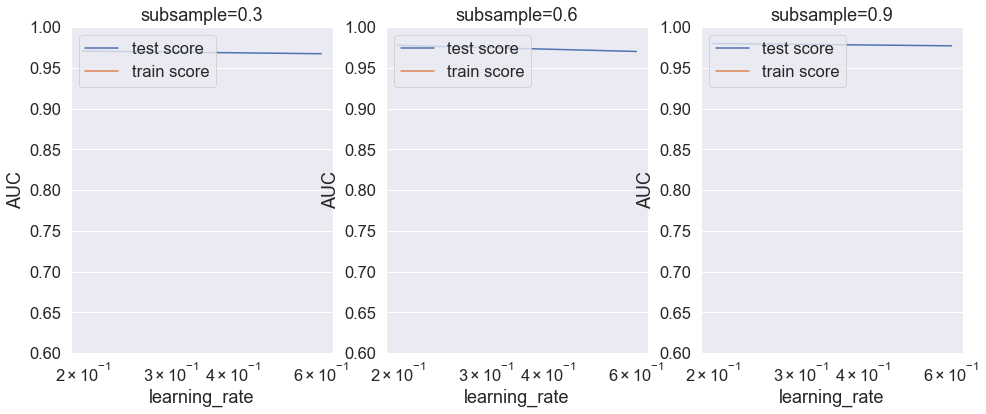

In [102]:
# # plotting
plt.figure(figsize=(16,6))

param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]} 


for n, subsample in enumerate(param_grid['subsample']):
    

    # subplot 1/n
    plt.subplot(1,len(param_grid['subsample']), n+1)
    df = cv_results[cv_results['param_subsample']==subsample]

    plt.plot(df["param_learning_rate"], df["mean_test_score"])
    plt.plot(df["param_learning_rate"], df["mean_train_score"])
    plt.xlabel('learning_rate')
    plt.ylabel('AUC')
    plt.title("subsample={0}".format(subsample))
    plt.ylim([0.60, 1])
    plt.legend(['test score', 'train score'], loc='upper left')
    plt.xscale('log')

In [103]:
model_cv.best_params_

{'learning_rate': 0.2, 'subsample': 0.9}

##### Model with optimal hyperparameters
We see that the train score almost touches to 1. Among the hyperparameters, we can choose the best parameters as learning_rate : 0.2 and subsample: 0.9

In [104]:
# chosen hyperparameters
# 'objective':'binary:logistic' outputs probability rather than label, which we need for calculating auc
params = {'learning_rate': 0.2,
          'max_depth': 2, 
          'n_estimators':200,
          'subsample':0.9,
         'objective':'binary:logistic'}

# fit model on training data
xgb_imb_model = XGBClassifier(params = params)
xgb_imb_model.fit(X_train, y_train)

[16:08:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "params" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:08:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1,
              params={'learning_rate': 0.2, 'max_depth': 2, 'n_estimators': 200,
                      'objective': 'binary:logistic', 'subsample': 0.9},
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)

##### Prediction on the train set

In [105]:
# Predictions on the train set
y_train_pred = xgb_imb_model.predict(X_train)

In [106]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_train, y_train_pred)
print(confusion)

[[219788      0]
 [     0    385]]


In [107]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [108]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_train, y_train_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_train, y_train_pred))

Accuracy:- 1.0
Sensitivity:- 1.0
Specificity:- 1.0
F1-Score:- 1.0


In [109]:
# classification_report
print(classification_report(y_train, y_train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    219788
           1       1.00      1.00      1.00       385

    accuracy                           1.00    220173
   macro avg       1.00      1.00      1.00    220173
weighted avg       1.00      1.00      1.00    220173



In [110]:
# Predicted probability
y_train_pred_proba_imb_xgb = xgb_imb_model.predict_proba(X_train)[:,1]

In [111]:
# roc_auc
auc = metrics.roc_auc_score(y_train, y_train_pred_proba_imb_xgb)
auc

1.0

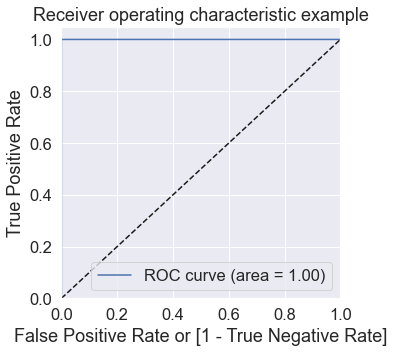

In [112]:
# Plot the ROC curve
draw_roc(y_train, y_train_pred_proba_imb_xgb)

##### Prediction on the test set

In [113]:
# Predictions on the test set
y_test_pred = xgb_imb_model.predict(X_test)

In [114]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion)

[[54950     6]
 [   18    70]]


In [115]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [116]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_test, y_test_pred))

Accuracy:- 0.9995639851754959
Sensitivity:- 0.7954545454545454
Specificity:- 0.9998908217483078
F1-Score:- 0.8536585365853658


In [117]:
# classification_report
print(classification_report(y_test, y_test_pred))


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     54956
           1       0.92      0.80      0.85        88

    accuracy                           1.00     55044
   macro avg       0.96      0.90      0.93     55044
weighted avg       1.00      1.00      1.00     55044



In [118]:
# Predicted probability
y_test_pred_proba = xgb_imb_model.predict_proba(X_test)[:,1]

In [119]:
# roc_auc
auc = metrics.roc_auc_score(y_test, y_test_pred_proba)
auc

0.991641246881803

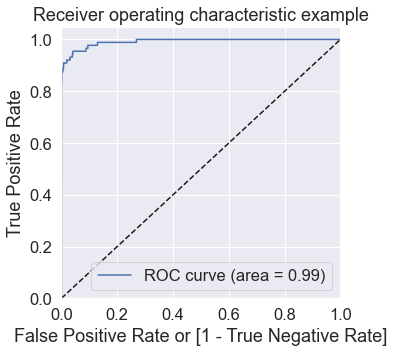

In [120]:
# Plot the ROC curve
draw_roc(y_test, y_test_pred_proba)

***Model summary For XG Boost***

- Train set
    - Accuracy = 1.0
    - Sensitivity = 1.0
    - Specificity = 1.0
    - F1-Score =  1.0
    - ROC-AUC = 1.0
    
- Test set
    - Accuracy = 0.999
    - Sensitivity = 0.795
    - Specificity =  0.999
    - F-1 Score = 0.854
    - ROC-AUC = 0.99

Overall, the model is performing well in the test set, what it had learnt from the train set.

### Random forest

In [121]:
# Importing random forest classifier
from sklearn.ensemble import RandomForestClassifier

In [122]:
param_grid = {
    'max_depth': range(5,10,5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
    'n_estimators': [100,200,300], 
    'max_features': [10, 20]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, 
                           param_grid = param_grid, 
                           cv = 2,
                           n_jobs = -1,
                           verbose = 1, 
                           return_train_score=True)

# Fit the model
grid_search.fit(X_train, y_train)


Fitting 2 folds for each of 24 candidates, totalling 48 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 out of  48 | elapsed: 62.4min finished


GridSearchCV(cv=2, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': range(5, 10, 5), 'max_features': [10, 20],
                         'min_samples_leaf': range(50, 150, 50),
                         'min_samples_split': range(50, 150, 50),
                         'n_estimators': [100, 200, 300]},
             return_train_score=True, verbose=1)

In [123]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.999164293367766 using {'max_depth': 5, 'max_features': 10, 'min_samples_leaf': 50, 'min_samples_split': 50, 'n_estimators': 200}


In [124]:
# model with the best hyperparameters

rfc_imb_model = RandomForestClassifier(bootstrap=True,
                             max_depth=5,
                             min_samples_leaf=50, 
                             min_samples_split=50,
                             max_features=10,
                             n_estimators=100)

In [125]:
# Fit the model
rfc_imb_model.fit(X_train, y_train)

RandomForestClassifier(max_depth=5, max_features=10, min_samples_leaf=50,
                       min_samples_split=50)

##### Prediction on the train set

In [126]:
# Predictions on the train set
y_train_pred = rfc_imb_model.predict(X_train)

In [127]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_train, y_train)
print(confusion)

[[219788      0]
 [     0    385]]


In [128]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [129]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_train, y_train_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_train, y_train_pred))

Accuracy:- 0.9993187175539235
Sensitivity:- 1.0
Specificity:- 1.0
F1-Score:- 0.7869318181818182


In [130]:
# classification_report
print(classification_report(y_train, y_train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    219788
           1       0.87      0.72      0.79       385

    accuracy                           1.00    220173
   macro avg       0.93      0.86      0.89    220173
weighted avg       1.00      1.00      1.00    220173



In [131]:
# Predicted probability
y_train_pred_proba = rfc_imb_model.predict_proba(X_train)[:,1]

In [132]:
# roc_auc
auc = metrics.roc_auc_score(y_train, y_train_pred_proba)
auc

0.9766468467016268

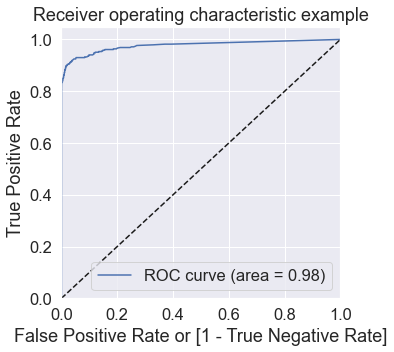

In [133]:
# Plot the ROC curve
draw_roc(y_train, y_train_pred_proba)

##### Prediction on the test set

In [134]:
# Predictions on the test set
y_test_pred = rfc_imb_model.predict(X_test)

In [135]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion)

[[54942    14]
 [   26    62]]


In [136]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [137]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_test, y_test_pred))

Accuracy:- 0.9992733086258266
Sensitivity:- 0.7045454545454546
Specificity:- 0.9997452507460514
F1-Score:- 0.7560975609756098


In [138]:
# classification_report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     54956
           1       0.82      0.70      0.76        88

    accuracy                           1.00     55044
   macro avg       0.91      0.85      0.88     55044
weighted avg       1.00      1.00      1.00     55044



In [139]:
# Predicted probability
y_test_pred_proba = rfc_imb_model.predict_proba(X_test)[:,1]

In [140]:
# roc_auc
auc = metrics.roc_auc_score(y_test, y_test_pred_proba)
auc

0.9752555143288184

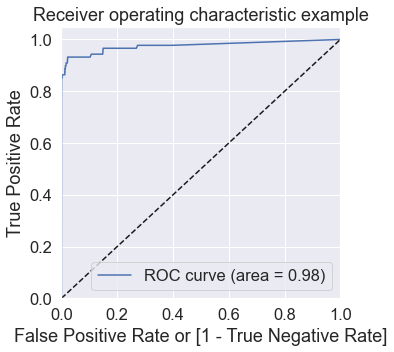

In [141]:
# Plot the ROC curve
draw_roc(y_test, y_test_pred_proba)

***Model summary for Random Forest***

- Train set
    - Accuracy = 0.999
    - Sensitivity = 1.0
    - Specificity = 1.0
    - F1-Score =  0.791
    - ROC-AUC = 0.98
    
- Test set
    - Accuracy = 0.999
    - Sensitivity = 0.716
    - Specificity =  0.999
    - F-1 Score = 0.791
    - ROC-AUC = 0.98

### Decision Tree

In [142]:
# Importing decision tree classifier
from sklearn.tree import DecisionTreeClassifier

In [143]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
}


# Instantiate the grid search model
dtree = DecisionTreeClassifier()

grid_search = GridSearchCV(estimator = dtree, 
                           param_grid = param_grid, 
                           scoring= 'roc_auc',
                           cv = 3, 
                           verbose = 1)

# Fit the grid search to the data
grid_search.fit(X_train,y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:  2.1min finished


GridSearchCV(cv=3, estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': range(5, 15, 5),
                         'min_samples_leaf': range(50, 150, 50),
                         'min_samples_split': range(50, 150, 50)},
             scoring='roc_auc', verbose=1)

In [144]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,3.615890,0.139225,0.051108,0.019790,5,50,50,"{'max_depth': 5, 'min_samples_leaf': 50, 'min_...",0.940702,0.940682,0.937965,0.939783,0.001286,4
1,4.036394,0.468440,0.036864,0.006212,5,50,100,"{'max_depth': 5, 'min_samples_leaf': 50, 'min_...",0.940702,0.940682,0.937968,0.939784,0.001284,3
2,3.785709,0.252373,0.026189,0.007480,5,100,50,"{'max_depth': 5, 'min_samples_leaf': 100, 'min...",0.940578,0.943011,0.949565,0.944385,0.003795,1
3,3.405967,0.107411,0.049446,0.020515,5,100,100,"{'max_depth': 5, 'min_samples_leaf': 100, 'min...",0.940578,0.943011,0.949565,0.944385,0.003795,1
4,6.552058,0.099969,0.057482,0.026380,10,50,50,"{'max_depth': 10, 'min_samples_leaf': 50, 'min...",0.932645,0.943935,0.920020,0.932200,0.009768,6
5,7.049740,0.754237,0.031821,0.000811,10,50,100,"{'max_depth': 10, 'min_samples_leaf': 50, 'min...",0.932574,0.943912,0.927579,0.934688,0.006833,5
6,6.317405,0.026554,0.036457,0.007367,10,100,50,"{'max_depth': 10, 'min_samples_leaf': 100, 'mi...",0.906800,0.915691,0.928835,0.917108,0.009052,7
7,6.333026,0.032103,0.031249,0.000001,10,100,100,"{'max_depth': 10, 'min_samples_leaf': 100, 'mi...",0.906809,0.908161,0.928871,0.914614,0.010096,8


In [145]:
# Printing the optimal sensitivity score and hyperparameters
print("Best roc_auc:-", grid_search.best_score_)
print(grid_search.best_estimator_)

Best roc_auc:- 0.9443845511010918
DecisionTreeClassifier(max_depth=5, min_samples_leaf=100, min_samples_split=50)


In [146]:
# Model with optimal hyperparameters
dt_imb_model = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = 100,
                                  max_depth=5, 
                                  min_samples_leaf=100,
                                  min_samples_split=100)

dt_imb_model.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=5, min_samples_leaf=100, min_samples_split=100,
                       random_state=100)

##### Prediction on the train set

In [147]:
# Predictions on the train set
y_train_pred = dt_imb_model.predict(X_train)

In [148]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_train, y_train)# Confusion matrix
print(confusion)

[[219788      0]
 [     0    385]]


In [149]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [150]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_train, y_train_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_train, y_train_pred))

Accuracy:- 0.9990825396392836
Sensitivity:- 1.0
Specificity:- 1.0
F1-Score:- 0.7209944751381216


In [151]:
# classification_report
print(classification_report(y_train, y_train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    219788
           1       0.77      0.68      0.72       385

    accuracy                           1.00    220173
   macro avg       0.88      0.84      0.86    220173
weighted avg       1.00      1.00      1.00    220173



In [152]:
# Predicted probability
y_train_pred_proba = dt_imb_model.predict_proba(X_train)[:,1]

In [153]:
# roc_auc
auc = metrics.roc_auc_score(y_train, y_train_pred_proba)
auc

0.9486907454385205

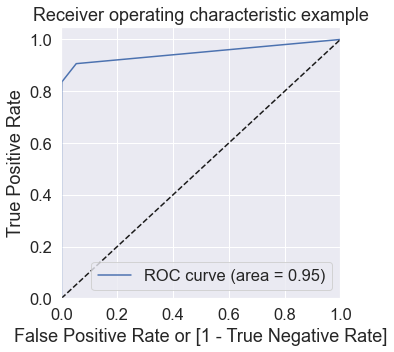

In [154]:
# Plot the ROC curve
draw_roc(y_train, y_train_pred_proba)

##### Prediction on the test set

In [155]:
# Predictions on the test set
y_test_pred = dt_imb_model.predict(X_test)

In [156]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion)

[[54935    21]
 [   29    59]]


In [157]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [158]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_test, y_test_pred))

Accuracy:- 0.9990916357822832
Sensitivity:- 0.6704545454545454
Specificity:- 0.999617876119077
F1-Score:- 0.7023809523809523


In [159]:
# classification_report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     54956
           1       0.74      0.67      0.70        88

    accuracy                           1.00     55044
   macro avg       0.87      0.84      0.85     55044
weighted avg       1.00      1.00      1.00     55044



In [160]:
# Predicted probability
y_test_pred_proba = dt_imb_model.predict_proba(X_test)[:,1]

In [161]:
# roc_auc
auc = metrics.roc_auc_score(y_test, y_test_pred_proba)
auc

0.9445566784005717

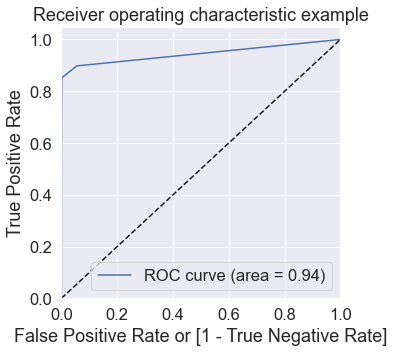

In [162]:
# Plot the ROC curve
draw_roc(y_test, y_test_pred_proba)

***Model summary for Decision Tree***

- Train set
    - Accuracy = 0.999
    - Sensitivity = 1.0
    - Specificity = 1.0
    - F1-Score =  0.721
    - ROC-AUC = 0.95
    
- Test set
    - Accuracy = 0.999
    - Sensitivity = 0.670
    - Specificity =  0.999
    - F-1 Score = 0.721
    - ROC-AUC = 0.94

### Choosing best model on the imbalanced data

We can see that among all the models we tried (Logistic, XGBoost, Decision Tree, and Random Forest), almost all of them have performed well. More specifically Logistic regression and XGBoost performed best in terms of ROC-AUC score.

But as we have to choose one of them, we can go for the best as `XGBoost`, which gives us ROC score of 1.0 on the train data and 0.99 on the test data.

`Keep in mind that XGBoost requires more resource utilization than Logistic model. Hence building XGBoost model is more costlier than the Logistic model.` 

But XGBoost having ROC score 0.99, which is 0.01 more than the Logistic model. The 0.01 increase of score may convert into huge amount of saving for the bank.

#### Print the important features of the best model to understand the dataset
- This will not give much explanation on the already transformed dataset
- But it will help us in understanding if the dataset is not PCA transformed

Top var = 18
2nd Top var = 15
3rd Top var = 11


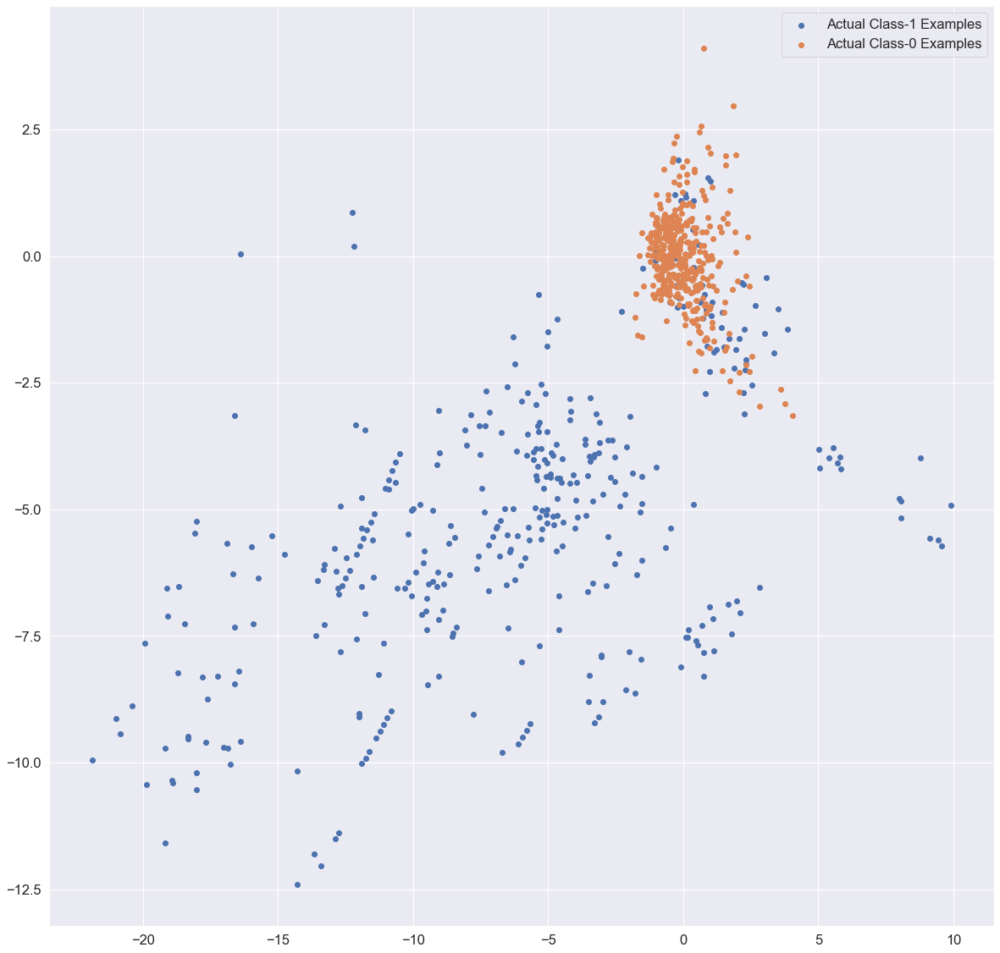

In [163]:
# Features of XGBoost model

var_imp = []
for i in xgb_imb_model.feature_importances_:
    var_imp.append(i)
print('Top var =', var_imp.index(np.sort(xgb_imb_model.feature_importances_)[-1])+1)
print('2nd Top var =', var_imp.index(np.sort(xgb_imb_model.feature_importances_)[-2])+1)
print('3rd Top var =', var_imp.index(np.sort(xgb_imb_model.feature_importances_)[-3])+1)
# Variable on Index-16 and Index-13 seems to be the top 2 variables
top_var_index = var_imp.index(np.sort(xgb_imb_model.feature_importances_)[-1])
second_top_var_index = var_imp.index(np.sort(xgb_imb_model.feature_importances_)[-2])

X_train_1 = X_train.to_numpy()[np.where(y_train==1.0)]
X_train_0 = X_train.to_numpy()[np.where(y_train==0.0)]

np.random.shuffle(X_train_0)

import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 20]

plt.scatter(X_train_1[:, top_var_index], X_train_1[:, second_top_var_index], label='Actual Class-1 Examples')
plt.scatter(X_train_0[:X_train_1.shape[0], top_var_index], X_train_0[:X_train_1.shape[0], second_top_var_index],
            label='Actual Class-0 Examples')
plt.legend()

#### Print the FPR,TPR & select the best threshold from the roc curve for the best model

In [164]:
print('Train auc =', metrics.roc_auc_score(y_train, y_train_pred_proba_imb_xgb))
fpr, tpr, thresholds = metrics.roc_curve(y_train, y_train_pred_proba_imb_xgb)
threshold = thresholds[np.argmax(tpr-fpr)]
print("Threshold=",threshold)

Train auc = 1.0
Threshold= 0.8467251


We can see that the threshold is 0.85, for which the TPR is the highest and FPR is the lowest and we got the best ROC score.

--------------------------------

# Handling data imbalance
As we see that the data is heavily imbalanced, We will try several approaches for handling data imbalance.

- Undersampling :- Here for balancing the class distribution, the non-fraudulent transctions count will be reduced to 396 (similar count of fraudulent transctions)
- Oversampling :- Here we will make the same count of non-fraudulent transctions as fraudulent transctions.
- SMOTE :- Synthetic minority oversampling technique. It is another oversampling technique, which uses nearest neighbor algorithm to create synthetic data. 
- Adasyn:- This is similar to SMOTE with minor changes that the new synthetic data is generated on the region of low density of imbalanced data points.

## Undersampling

In [165]:
# Importing undersampler library
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter

# instantiating the random undersampler 
rus = RandomUnderSampler()
# resampling X, y
X_train_rus, y_train_rus = rus.fit_resample(X_train, y_train)

# Befor sampling class distribution
print('Before sampling class distribution:-',Counter(y_train))
# new class distribution 
print('New class distribution:-',Counter(y_train_rus))

Before sampling class distribution:- Counter({0: 219788, 1: 385})
New class distribution:- Counter({0: 385, 1: 385})


## Model building on balanced data with Undersampling

### Logistic Regression

In [166]:
# Creating KFold object with 5 splits
folds = KFold(n_splits=5, shuffle=True, random_state=4)

# Specify params
params = {"C": [0.01, 0.1, 1, 10, 100, 1000]}

# Specifing score as roc-auc
model_cv = GridSearchCV(estimator = LogisticRegression(),
                        param_grid = params, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True) 

# Fit the model
model_cv.fit(X_train_rus, y_train_rus)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    1.0s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=4, shuffle=True),
             estimator=LogisticRegression(),
             param_grid={'C': [0.01, 0.1, 1, 10, 100, 1000]},
             return_train_score=True, scoring='roc_auc', verbose=1)

In [167]:
# results of grid search CV
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.051815,0.075674,0.004995,6.327899e-04,0.01,{'C': 0.01},0.994898,0.983632,0.973520,0.961480,0.985807,0.979867,0.011435,1,0.981733,0.983586,0.986381,0.988959,0.983562,0.984844,0.002538
1,0.013300,0.004653,0.000000,0.000000e+00,0.1,{'C': 0.1},0.996088,0.986019,0.973351,0.956050,0.981019,0.978505,0.013437,2,0.984623,0.984905,0.987941,0.990604,0.986232,0.986861,0.002209
2,0.022645,0.001714,0.003997,5.917394e-07,1,{'C': 1},0.995238,0.988917,0.973014,0.958595,0.970417,0.977236,0.013209,3,0.986690,0.985854,0.989069,0.992207,0.987340,0.988232,0.002251
3,0.020319,0.008273,0.010175,6.794998e-03,10,{'C': 10},0.994558,0.990793,0.973689,0.954692,0.965287,0.975804,0.015081,4,0.987481,0.986129,0.989311,0.993356,0.988004,0.988856,0.002470
4,0.024999,0.007655,0.006250,7.654130e-03,100,{'C': 100},0.994558,0.990281,0.973857,0.950789,0.963919,0.974681,0.016284,5,0.987544,0.986076,0.989343,0.993662,0.988120,0.988949,0.002580
5,0.025968,0.010903,0.003924,6.051735e-03,1000,{'C': 1000},0.994558,0.990281,0.973689,0.950619,0.963748,0.974579,0.016358,6,0.987576,0.986108,0.989374,0.993652,0.988131,0.988968,0.002566


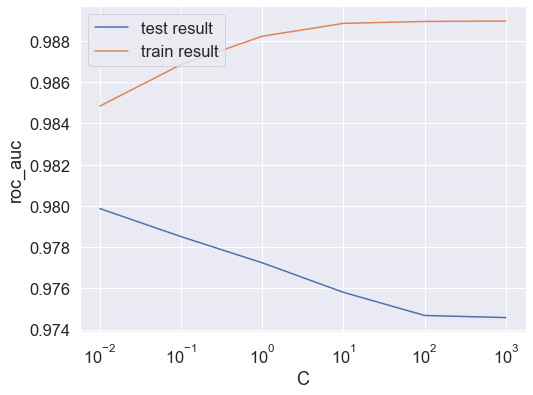

In [168]:
# plot of C versus train and validation scores

plt.figure(figsize=(8, 6))
plt.plot(cv_results['param_C'], cv_results['mean_test_score'])
plt.plot(cv_results['param_C'], cv_results['mean_train_score'])
plt.xlabel('C')
plt.ylabel('roc_auc')
plt.legend(['test result', 'train result'], loc='upper left')
plt.xscale('log')

In [169]:
# Best score with best C
best_score = model_cv.best_score_
best_C = model_cv.best_params_['C']

print(" The highest test roc_auc is {0} at C = {1}".format(best_score, best_C))

 The highest test roc_auc is 0.9798672988984937 at C = 0.01


#### Logistic regression with optimal C

In [170]:
# Instantiate the model with best C
logistic_bal_rus = LogisticRegression(C=0.01)

In [171]:
# Fit the model on the train set
logistic_bal_rus_model = logistic_bal_rus.fit(X_train_rus, y_train_rus)

##### Prediction on the train set

In [172]:
# Predictions on the train set
y_train_pred = logistic_bal_rus_model.predict(X_train_rus)

In [173]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_train_rus, y_train_pred)
print(confusion)

[[381   4]
 [ 51 334]]


In [174]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [175]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_train_rus, y_train_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_train_rus, y_train_pred))

Accuracy:- 0.9285714285714286
Sensitivity:- 0.8675324675324675
Specificity:- 0.9896103896103896
F1-Score:- 0.9239280774550485


In [176]:
# classification_report
print(classification_report(y_train_rus, y_train_pred))

              precision    recall  f1-score   support

           0       0.88      0.99      0.93       385
           1       0.99      0.87      0.92       385

    accuracy                           0.93       770
   macro avg       0.94      0.93      0.93       770
weighted avg       0.94      0.93      0.93       770



In [177]:
# Predicted probability
y_train_pred_proba = logistic_bal_rus_model.predict_proba(X_train_rus)[:,1]

In [178]:
# roc_auc
auc = metrics.roc_auc_score(y_train_rus, y_train_pred_proba)
auc

0.9845167819193793

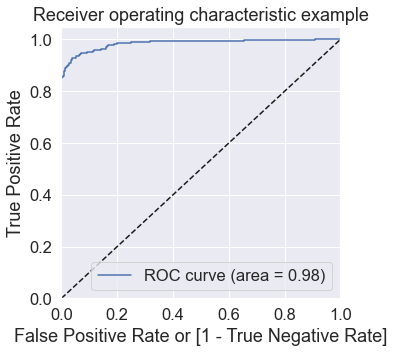

In [179]:
# Plot the ROC curve
draw_roc(y_train_rus, y_train_pred_proba)

#### Prediction on the test set

In [180]:
# Prediction on the test set
y_test_pred = logistic_bal_rus_model.predict(X_test)

In [181]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion)

[[54326   630]
 [    7    81]]


In [182]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [183]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_test, y_test_pred))

Accuracy:- 0.9884274398662888
Sensitivity:- 0.9204545454545454
Specificity:- 0.9885362835723124
F1-Score:- 0.20275344180225283


High Accuracy but low F1 score could indicate underfitting on an unbalanced dataset.

In [184]:
# classification_report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99     54956
           1       0.11      0.92      0.20        88

    accuracy                           0.99     55044
   macro avg       0.56      0.95      0.60     55044
weighted avg       1.00      0.99      0.99     55044



In [185]:
# Predicted probability
y_test_pred_proba = logistic_bal_rus_model.predict_proba(X_test)[:,1]

In [186]:
# roc_auc
auc = metrics.roc_auc_score(y_test, y_test_pred_proba)
auc

0.9866783923006174

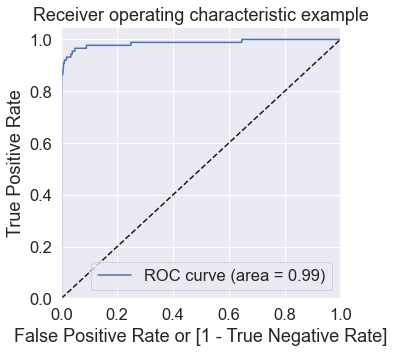

In [187]:
# Plot the ROC curve
draw_roc(y_test, y_test_pred_proba)

***Model summary for Undersampling- Logistic Regression***

- Train set
    - Accuracy = 0.95
    - Sensitivity = 0.92
    - Specificity = 0.98
    - F1 score = 0.927
    - ROC = 0.99
- Test set
    - Accuracy = 0.97
    - Sensitivity = 0.86
    - Specificity = 0.97
    - F1 score = 0.227
    - ROC = 0.96
    
High Accuracy but low F1 score.

`As we can see that there is a sudden drop in F1 score, it indicate underfitting on an unbalanced dataset.`

### XGBoost

In [188]:
# hyperparameter tuning with XGBoost

# creating a KFold object 
folds = 3

# specify range of hyperparameters
param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]}          


# specify model
xgb_model = XGBClassifier(max_depth=2, n_estimators=200)

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = xgb_model, 
                        param_grid = param_grid, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)      

# fit the model
model_cv.fit(X_train_rus, y_train_rus)       

Fitting 3 folds for each of 6 candidates, totalling 18 fits
[17:22:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[17:22:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:22:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:22:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:22:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[Parallel(n_jobs=1)]: Done  18 out of  18 | elapsed:    4.2s finished


[17:22:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=2, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=200, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None, va

In [189]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,0.236455,0.048978,0.002997,4.238512e-03,0.2,0.3,"{'learning_rate': 0.2, 'subsample': 0.3}",0.982498,0.964087,0.971741,0.972775,0.007552,6,0.999726,1.0,1.0,0.999909,0.000129
1,0.234480,0.006704,0.009410,1.361050e-03,0.2,0.6,"{'learning_rate': 0.2, 'subsample': 0.6}",0.985102,0.967539,0.981323,0.977988,0.007548,2,1.000000,1.0,1.0,1.000000,0.000000
2,0.248693,0.005020,0.007992,3.893359e-07,0.2,0.9,"{'learning_rate': 0.2, 'subsample': 0.9}",0.986797,0.971475,0.981445,0.979906,0.006349,1,1.000000,1.0,1.0,1.000000,0.000000
3,0.184765,0.006242,0.000000,0.000000e+00,0.6,0.3,"{'learning_rate': 0.6, 'subsample': 0.3}",0.979530,0.966751,0.974365,0.973549,0.005249,5,0.999985,1.0,1.0,0.999995,0.000007
4,0.205828,0.009641,0.010418,7.366314e-03,0.6,0.6,"{'learning_rate': 0.6, 'subsample': 0.6}",0.980378,0.970082,0.973206,0.974555,0.004310,4,1.000000,1.0,1.0,1.000000,0.000000
5,0.208568,0.009336,0.008608,6.477625e-03,0.6,0.9,"{'learning_rate': 0.6, 'subsample': 0.9}",0.983043,0.971596,0.977661,0.977433,0.004676,3,1.000000,1.0,1.0,1.000000,0.000000


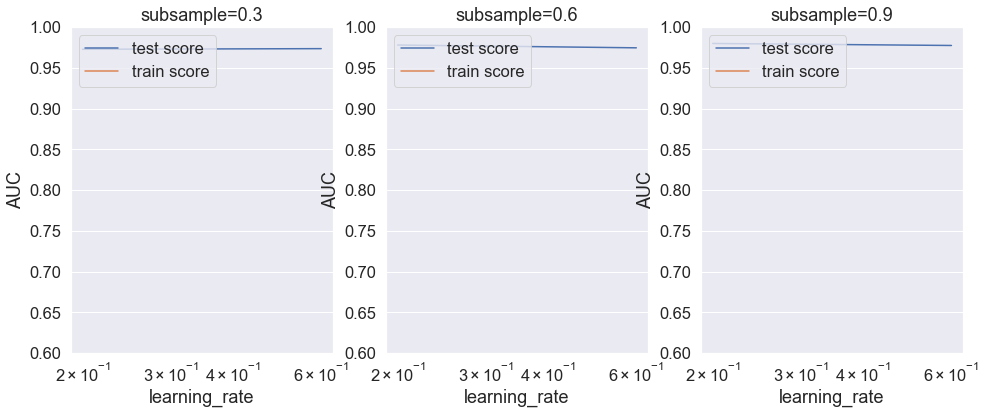

In [190]:
# # plotting
plt.figure(figsize=(16,6))

param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]} 


for n, subsample in enumerate(param_grid['subsample']):
    

    # subplot 1/n
    plt.subplot(1,len(param_grid['subsample']), n+1)
    df = cv_results[cv_results['param_subsample']==subsample]

    plt.plot(df["param_learning_rate"], df["mean_test_score"])
    plt.plot(df["param_learning_rate"], df["mean_train_score"])
    plt.xlabel('learning_rate')
    plt.ylabel('AUC')
    plt.title("subsample={0}".format(subsample))
    plt.ylim([0.60, 1])
    plt.legend(['test score', 'train score'], loc='upper left')
    plt.xscale('log')

In [191]:
model_cv.best_params_

{'learning_rate': 0.2, 'subsample': 0.9}

##### Model with optimal hyperparameters
We see that the train score almost touches to 1. Among the hyperparameters, we can choose the best parameters as learning_rate : 0.2 and subsample: 0.9

In [192]:
# chosen hyperparameters
# 'objective':'binary:logistic' outputs probability rather than label, which we need for calculating auc
params = {'learning_rate': 0.2,
          'max_depth': 2, 
          'n_estimators':200,
          'subsample':0.9,
         'objective':'binary:logistic'}

# fit model on training data
xgb_bal_rus_model = XGBClassifier(params = params)
xgb_bal_rus_model.fit(X_train_rus, y_train_rus)

[17:22:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "params" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[17:22:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1,
              params={'learning_rate': 0.2, 'max_depth': 2, 'n_estimators': 200,
                      'objective': 'binary:logistic', 'subsample': 0.9},
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)

##### Prediction on the train set

In [193]:
# Predictions on the train set
y_train_pred = xgb_bal_rus_model.predict(X_train_rus)

In [194]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_train_rus, y_train_rus)
print(confusion)

[[385   0]
 [  0 385]]


In [195]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [196]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_train_rus, y_train_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_train_rus, y_train_pred))

Accuracy:- 1.0
Sensitivity:- 1.0
Specificity:- 1.0
F1-Score:- 1.0


In [197]:
# classification_report
print(classification_report(y_train_rus, y_train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       385
           1       1.00      1.00      1.00       385

    accuracy                           1.00       770
   macro avg       1.00      1.00      1.00       770
weighted avg       1.00      1.00      1.00       770



In [198]:
# Predicted probability
y_train_pred_proba = xgb_bal_rus_model.predict_proba(X_train_rus)[:,1]

In [199]:
# roc_auc
auc = metrics.roc_auc_score(y_train_rus, y_train_pred_proba)
auc

1.0

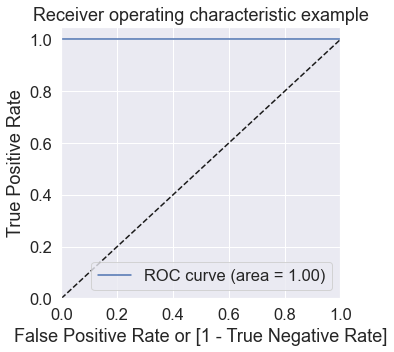

In [200]:
# Plot the ROC curve
draw_roc(y_train_rus, y_train_pred_proba)

##### Prediction on the test set

In [201]:
# Predictions on the test set
y_test_pred = xgb_bal_rus_model.predict(X_test)

In [202]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion)

[[52956  2000]
 [    4    84]]


In [203]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [204]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_test, y_test_pred))

Accuracy:- 0.9635927621539132
Sensitivity:- 0.9545454545454546
Specificity:- 0.9636072494359124
F1-Score:- 0.07734806629834254


In [205]:
# classification_report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98     54956
           1       0.04      0.95      0.08        88

    accuracy                           0.96     55044
   macro avg       0.52      0.96      0.53     55044
weighted avg       1.00      0.96      0.98     55044



In [206]:
# Predicted probability
y_test_pred_proba = xgb_bal_rus_model.predict_proba(X_test)[:,1]

In [207]:
# roc_auc
auc = metrics.roc_auc_score(y_test, y_test_pred_proba)
auc

0.9877489801758763

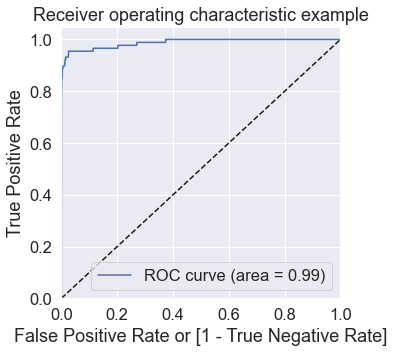

In [208]:
# Plot the ROC curve
draw_roc(y_test, y_test_pred_proba)

***Model summary for Undersampling- XG Boost***

- Train set
    - Accuracy = 1.0
    - Sensitivity = 1.0
    - Specificity = 1.0
    - F1 score = 1.0
    - ROC = 1.0
    
- Test set
    - Accuracy = 0.953
    - Sensitivity = 0.954
    - Specificity = 0.953
    - F1 score = 0.061
    - ROC = 0.99
    
High Accuracy but low F1 score on testset.

`As we can see that there is a sudden drop` **from 1.0 to 0.06** `in F1 score, it indicate underfitting on an unbalanced dataset.`

Undersampling, that consists of reducing the data by eliminating examples belonging to the majority class with the objective of equalizing the number of examples of each class
With undersampling we drop a lot of information. Even if this dropped information belongs to the majority class, it is usefull information for a modeling algorithm.

Because of this, it could happen that the AUC might go high just because of high negative samples and in such a case F1 score may remain low since it is an overall measure combining precision and recall(lower recall is a problem with skewed datasets).

### Decision Tree

In [209]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
}


# Instantiate the grid search model
dtree = DecisionTreeClassifier()

grid_search = GridSearchCV(estimator = dtree, 
                           param_grid = param_grid, 
                           scoring= 'roc_auc',
                           cv = 3, 
                           verbose = 1)

# Fit the grid search to the data
grid_search.fit(X_train_rus,y_train_rus)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.3s finished


GridSearchCV(cv=3, estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': range(5, 15, 5),
                         'min_samples_leaf': range(50, 150, 50),
                         'min_samples_split': range(50, 150, 50)},
             scoring='roc_auc', verbose=1)

In [210]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,0.007326,1.883852e-03,0.003998,8.778064e-07,5,50,50,"{'max_depth': 5, 'min_samples_leaf': 50, 'min_...",0.956426,0.940619,0.941956,0.946333,0.007157,8
1,0.007325,4.708086e-04,0.004664,9.432471e-04,5,50,100,"{'max_depth': 5, 'min_samples_leaf': 50, 'min_...",0.952429,0.940619,0.951050,0.948032,0.005272,7
2,0.007657,1.244623e-03,0.004662,4.715952e-04,5,100,50,"{'max_depth': 5, 'min_samples_leaf': 100, 'min...",0.950309,0.942648,0.952606,0.948521,0.004258,5
3,0.005993,4.899036e-07,0.003997,8.145893e-04,5,100,100,"{'max_depth': 5, 'min_samples_leaf': 100, 'min...",0.950309,0.944010,0.952393,0.948904,0.003563,4
4,0.005688,1.208092e-03,0.002332,1.698506e-03,10,50,50,"{'max_depth': 10, 'min_samples_leaf': 50, 'min...",0.961906,0.940619,0.941925,0.948150,0.009742,6
5,0.005209,7.366595e-03,0.005208,7.365696e-03,10,50,100,"{'max_depth': 10, 'min_samples_leaf': 50, 'min...",0.951369,0.940619,0.955139,0.949042,0.006152,3
6,0.007539,6.390163e-03,0.043421,5.791045e-02,10,100,50,"{'max_depth': 10, 'min_samples_leaf': 100, 'mi...",0.955275,0.943284,0.952606,0.950388,0.005140,1
7,0.004994,1.123916e-07,0.003665,4.710333e-04,10,100,100,"{'max_depth': 10, 'min_samples_leaf': 100, 'mi...",0.954306,0.943738,0.952393,0.950145,0.004598,2


In [211]:
# Printing the optimal sensitivity score and hyperparameters
print("Best roc_auc:-", grid_search.best_score_)
print(grid_search.best_estimator_)

Best roc_auc:- 0.9503882750676276
DecisionTreeClassifier(max_depth=10, min_samples_leaf=100, min_samples_split=50)


In [212]:
# Model with optimal hyperparameters
dt_bal_rus_model = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = 100,
                                  max_depth=10, 
                                  min_samples_leaf=50,
                                  min_samples_split=50)

dt_bal_rus_model.fit(X_train_rus, y_train_rus)

DecisionTreeClassifier(max_depth=10, min_samples_leaf=50, min_samples_split=50,
                       random_state=100)

##### Prediction on the train set

In [213]:
# Predictions on the train set
y_train_pred = dt_bal_rus_model.predict(X_train_rus)

In [214]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_train_rus, y_train_pred)
print(confusion)

[[373  12]
 [ 52 333]]


In [215]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [216]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_train_rus, y_train_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_train_rus, y_train_pred))

Accuracy:- 0.9168831168831169
Sensitivity:- 0.8649350649350649
Specificity:- 0.9688311688311688
F1-Score:- 0.9123287671232877


In [217]:
# classification_report
print(classification_report(y_train_rus, y_train_pred))

              precision    recall  f1-score   support

           0       0.88      0.97      0.92       385
           1       0.97      0.86      0.91       385

    accuracy                           0.92       770
   macro avg       0.92      0.92      0.92       770
weighted avg       0.92      0.92      0.92       770



In [218]:
# Predicted probability
y_train_pred_proba = dt_bal_rus_model.predict_proba(X_train_rus)[:,1]

In [219]:
# roc_auc
auc = metrics.roc_auc_score(y_train_rus, y_train_pred_proba)
auc

0.9771732163939956

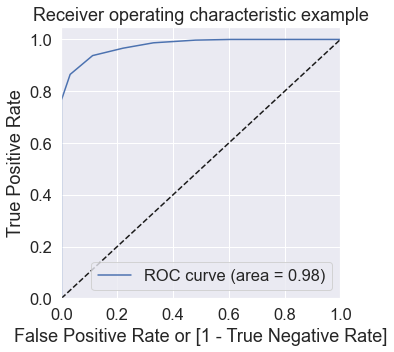

In [220]:
# Plot the ROC curve
draw_roc(y_train_rus, y_train_pred_proba)

##### Prediction on the test set

In [221]:
# Predictions on the test set
y_test_pred = dt_bal_rus_model.predict(X_test)

In [222]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion)

[[52811  2145]
 [    7    81]]


In [223]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [224]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_test, y_test_pred))

Accuracy:- 0.9609040040694717
Sensitivity:- 0.9204545454545454
Specificity:- 0.960968775020016
F1-Score:- 0.07000864304235091


In [225]:
# classification_report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98     54956
           1       0.04      0.92      0.07        88

    accuracy                           0.96     55044
   macro avg       0.52      0.94      0.53     55044
weighted avg       1.00      0.96      0.98     55044



In [226]:
# Predicted probability
y_test_pred_proba = dt_bal_rus_model.predict_proba(X_test)[:,1]

In [227]:
# roc_auc
auc = metrics.roc_auc_score(y_test, y_test_pred_proba)
auc

0.9737538998140662

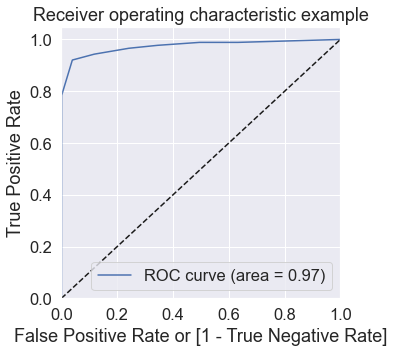

In [228]:
# Plot the ROC curve
draw_roc(y_test, y_test_pred_proba)

***Model summary for Undersampling- Decision Tree***

- Train set
    - Accuracy = 0.927
    - Sensitivity = 0.904
    - Specificity = 0.951
    - F1 score = 0.925
    - AUC = 0.98
    
- Test set
    - Accuracy = 0.929
    - Sensitivity = 0.920
    - Specificity = 0.929
    - F1 score = 0.039
    - AUC = 0.96
    
High Accuracy and AUC but low F1 score on testset.

`As we can see that there is a sudden drop` **from 0.92 to 0.04** `in F1 score, it indicate underfitting on an unbalanced dataset.`

### Random forest

In [229]:
param_grid = {
    'max_depth': range(5,10,5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
    'n_estimators': [100,200,300], 
    'max_features': [10, 20]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, 
                           param_grid = param_grid, 
                           scoring= 'roc_auc',
                           cv = 2,
                           n_jobs = -1,
                           verbose = 1, 
                           return_train_score=True)

# Fit the model
grid_search.fit(X_train_rus, y_train_rus)


Fitting 2 folds for each of 24 candidates, totalling 48 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 out of  48 | elapsed:   40.9s finished


GridSearchCV(cv=2, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': range(5, 10, 5), 'max_features': [10, 20],
                         'min_samples_leaf': range(50, 150, 50),
                         'min_samples_split': range(50, 150, 50),
                         'n_estimators': [100, 200, 300]},
             return_train_score=True, scoring='roc_auc', verbose=1)

In [230]:
# printing the optimal accuracy score and hyperparameters
print('We can get roc-auc of',grid_search.best_score_,'using',grid_search.best_params_)

We can get roc-auc of 0.9749568221070812 using {'max_depth': 5, 'max_features': 10, 'min_samples_leaf': 50, 'min_samples_split': 100, 'n_estimators': 200}


In [231]:
# model with the best hyperparameters

rfc_bal_rus_model = RandomForestClassifier(bootstrap=True,
                             max_depth=5,
                             min_samples_leaf=50, 
                             min_samples_split=50,
                             max_features=10,
                             n_estimators=200)

In [232]:
# Fit the model
rfc_bal_rus_model.fit(X_train_rus, y_train_rus)

RandomForestClassifier(max_depth=5, max_features=10, min_samples_leaf=50,
                       min_samples_split=50, n_estimators=200)

##### Prediction on the train set

In [233]:
# Predictions on the train set
y_train_pred = rfc_bal_rus_model.predict(X_train_rus)

In [234]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_train_rus, y_train_pred)
print(confusion)

[[381   4]
 [ 50 335]]


In [235]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [236]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_train_rus, y_train_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_train_rus, y_train_pred))

Accuracy:- 0.9298701298701298
Sensitivity:- 0.8701298701298701
Specificity:- 0.9896103896103896
F1-Score:- 0.9254143646408839


In [237]:
# classification_report
print(classification_report(y_train_rus, y_train_pred))

              precision    recall  f1-score   support

           0       0.88      0.99      0.93       385
           1       0.99      0.87      0.93       385

    accuracy                           0.93       770
   macro avg       0.94      0.93      0.93       770
weighted avg       0.94      0.93      0.93       770



In [238]:
# Predicted probability
y_train_pred_proba = rfc_bal_rus_model.predict_proba(X_train_rus)[:,1]

In [239]:
# roc_auc
auc = metrics.roc_auc_score(y_train_rus, y_train_pred_proba)
auc

0.9855220104570753

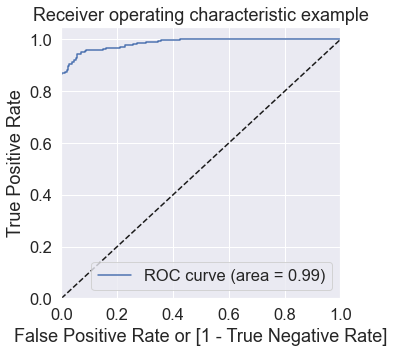

In [240]:
# Plot the ROC curve
draw_roc(y_train_rus, y_train_pred_proba)

##### Prediction on the test set

In [241]:
# Predictions on the test set
y_test_pred = rfc_bal_rus_model.predict(X_test)

In [242]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion)

[[54011   945]
 [    9    79]]


In [243]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [244]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_test, y_test_pred))

Accuracy:- 0.9826684107259647
Sensitivity:- 0.8977272727272727
Specificity:- 0.9828044253584686
F1-Score:- 0.1420863309352518


In [245]:
# classification_report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99     54956
           1       0.08      0.90      0.14        88

    accuracy                           0.98     55044
   macro avg       0.54      0.94      0.57     55044
weighted avg       1.00      0.98      0.99     55044



In [246]:
# Predicted probability
y_test_pred_proba = rfc_bal_rus_model.predict_proba(X_test)[:,1]

In [247]:
# roc_auc
auc = metrics.roc_auc_score(y_test, y_test_pred_proba)
auc

0.9827353618431935

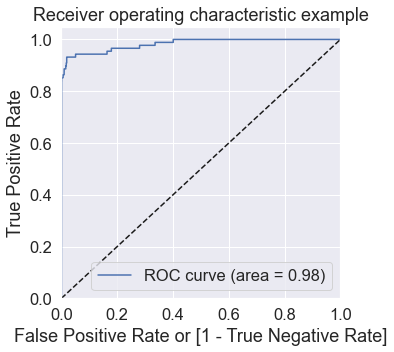

In [248]:
# Plot the ROC curve
draw_roc(y_test, y_test_pred_proba)

***Model summary for Undersampling- Decision Tree***

- Train set
    - Accuracy = 0.929
    - Sensitivity = 0.865
    - Specificity = 0.995
    - F1 score = 0.925
    - AUC = 0.98
    
- Test set
    - Accuracy = 0.987
    - Sensitivity = 0.920
    - Specificity = 0.987
    - F1 score = 0.188
    - AUC = 0.98
    
High Accuracy and AUC but low F1 score on testset.

# Oversampling

In [249]:
# Importing oversampler library
from imblearn.over_sampling import RandomOverSampler

In [250]:
# instantiating the random oversampler 
ros = RandomOverSampler()
# resampling X, y
X_train_ros, y_train_ros = ros.fit_resample(X_train, y_train)

In [251]:
# Befor sampling class distribution
print('Before sampling class distribution:-',Counter(y_train))
# new class distribution 
print('New class distribution:-',Counter(y_train_ros))

Before sampling class distribution:- Counter({0: 219788, 1: 385})
New class distribution:- Counter({0: 219788, 1: 219788})


### Logistic Regression

In [252]:
# Creating KFold object with 5 splits
folds = KFold(n_splits=5, shuffle=True, random_state=4)

# Specify params
params = {"C": [0.01, 0.1, 1, 10, 100, 1000]}

# Specifing score as roc-auc
model_cv = GridSearchCV(estimator = LogisticRegression(),
                        param_grid = params, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True) 

# Fit the model
model_cv.fit(X_train_ros, y_train_ros)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:  1.0min finished


GridSearchCV(cv=KFold(n_splits=5, random_state=4, shuffle=True),
             estimator=LogisticRegression(),
             param_grid={'C': [0.01, 0.1, 1, 10, 100, 1000]},
             return_train_score=True, scoring='roc_auc', verbose=1)

In [253]:
# results of grid search CV
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.669103,0.080965,0.037497,0.007655,0.01,{'C': 0.01},0.986155,0.986632,0.985518,0.985990,0.986809,0.986221,0.000462,6,0.986301,0.986125,0.986356,0.986237,0.986155,0.986235,0.000087
1,1.884284,0.295888,0.040624,0.012498,0.1,{'C': 0.1},0.986215,0.986701,0.985583,0.986056,0.986879,0.986287,0.000464,5,0.986365,0.986193,0.986423,0.986310,0.986221,0.986302,0.000086
2,1.868667,0.240158,0.037489,0.012487,1,{'C': 1},0.986223,0.986706,0.985588,0.986063,0.986887,0.986293,0.000464,4,0.986371,0.986198,0.986429,0.986315,0.986226,0.986308,0.000087
3,1.621973,0.038723,0.037496,0.007655,10,{'C': 10},0.986223,0.986707,0.985589,0.986063,0.986888,0.986294,0.000464,1,0.986372,0.986199,0.986430,0.986316,0.986226,0.986309,0.000087
4,2.003717,0.273570,0.058291,0.035249,100,{'C': 100},0.986223,0.986706,0.985589,0.986063,0.986888,0.986294,0.000465,2,0.986372,0.986199,0.986431,0.986316,0.986226,0.986309,0.000087
5,1.745623,0.148149,0.037495,0.007655,1000,{'C': 1000},0.986223,0.986706,0.985589,0.986063,0.986888,0.986294,0.000464,3,0.986372,0.986199,0.986431,0.986316,0.986226,0.986309,0.000087


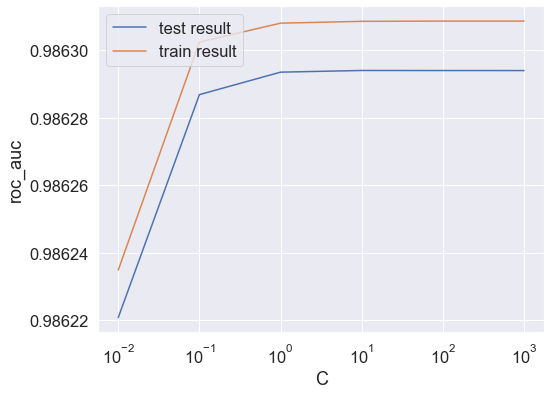

In [254]:
# plot of C versus train and validation scores

plt.figure(figsize=(8, 6))
plt.plot(cv_results['param_C'], cv_results['mean_test_score'])
plt.plot(cv_results['param_C'], cv_results['mean_train_score'])
plt.xlabel('C')
plt.ylabel('roc_auc')
plt.legend(['test result', 'train result'], loc='upper left')
plt.xscale('log')

In [255]:
# Best score with best C
best_score = model_cv.best_score_
best_C = model_cv.best_params_['C']

print(" The highest test roc_auc is {0} at C = {1}".format(best_score, best_C))

 The highest test roc_auc is 0.9862939839368379 at C = 10


#### Logistic regression with optimal C

In [256]:
# Instantiate the model with best C
logistic_bal_ros = LogisticRegression(C=1000)

In [257]:
# Fit the model on the train set
logistic_bal_ros_model = logistic_bal_ros.fit(X_train_ros, y_train_ros)

##### Prediction on the train set

In [258]:
# Predictions on the train set
y_train_pred = logistic_bal_ros_model.predict(X_train_ros)

In [259]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_train_ros, y_train_pred)
print(confusion)

[[213438   6350]
 [ 19542 200246]]


In [260]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [261]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_train_ros, y_train_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_train_ros, y_train_pred))

Accuracy:- 0.9410977851384061
Sensitivity:- 0.9110870475185179
Specificity:- 0.9711085227582944
F1-Score:- 0.9392753949491538


In [262]:
# classification_report
print(classification_report(y_train_ros, y_train_pred))

              precision    recall  f1-score   support

           0       0.92      0.97      0.94    219788
           1       0.97      0.91      0.94    219788

    accuracy                           0.94    439576
   macro avg       0.94      0.94      0.94    439576
weighted avg       0.94      0.94      0.94    439576



In [263]:
# Predicted probability
y_train_pred_proba = logistic_bal_ros_model.predict_proba(X_train_ros)[:,1]

In [264]:
# roc_auc
auc = metrics.roc_auc_score(y_train_ros, y_train_pred_proba)
auc

0.9863031167732507

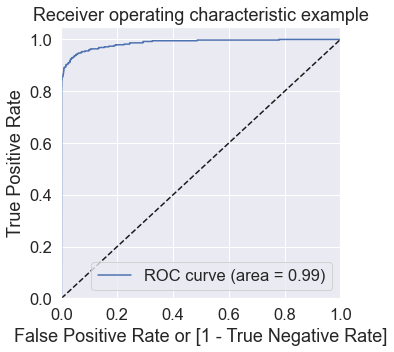

In [265]:
# Plot the ROC curve
draw_roc(y_train_ros, y_train_pred_proba)

#### Prediction on the test set

In [266]:
# Prediction on the test set
y_test_pred = logistic_bal_ros_model.predict(X_test)

In [267]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion)

[[53380  1576]
 [    5    83]]


In [268]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [269]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_test, y_test_pred))

Accuracy:- 0.9712775234357968
Sensitivity:- 0.9431818181818182
Specificity:- 0.971322512555499
F1-Score:- 0.09502003434459073


In [270]:
# classification_report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       1.00      0.97      0.99     54956
           1       0.05      0.94      0.10        88

    accuracy                           0.97     55044
   macro avg       0.52      0.96      0.54     55044
weighted avg       1.00      0.97      0.98     55044



In [271]:
# Predicted probability
y_test_pred_proba = logistic_bal_ros_model.predict_proba(X_test)[:,1]

In [272]:
# roc_auc
auc = metrics.roc_auc_score(y_test, y_test_pred_proba)
auc

0.9805187124906537

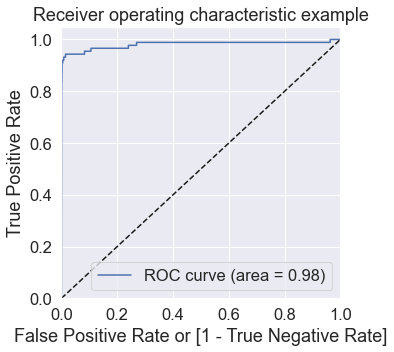

In [273]:
# Plot the ROC curve
draw_roc(y_test, y_test_pred_proba)

***Model summary for Over_Sampling- Logistic Regression***

- Train set
    - Accuracy = 0.941
    - Sensitivity = 0.811
    - Specificity = 0.971
    - F1 score = 0.939
    - AUC = 0.99
    
- Test set
    - Accuracy = 0.971
    - Sensitivity = 0.943
    - Specificity = 0.971
    - F1 score = 0.094
    - AUC = 0.98
    
High Accuracy and AUC but low F1 score on testset.

### XGBoost

In [274]:
# hyperparameter tuning with XGBoost

# creating a KFold object 
folds = 3

# specify range of hyperparameters
param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]}          


# specify model
xgb_model = XGBClassifier(max_depth=2, n_estimators=200)

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = xgb_model, 
                        param_grid = param_grid, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)      

# fit the model
model_cv.fit(X_train_ros, y_train_ros)       

Fitting 3 folds for each of 6 candidates, totalling 18 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[17:24:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:25:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:26:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:27:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[Parallel(n_jobs=1)]: Done  18 out of  18 | elapsed: 18.3min finished


[17:42:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=2, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=200, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None, va

In [275]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,50.987600,0.967428,0.248216,0.021451,0.2,0.3,"{'learning_rate': 0.2, 'subsample': 0.3}",0.999897,0.999862,0.999877,0.999879,0.000014,6,0.999884,0.999910,0.999897,0.999897,0.000011
1,61.668008,1.963306,0.257670,0.027027,0.2,0.6,"{'learning_rate': 0.2, 'subsample': 0.6}",0.999911,0.999866,0.999905,0.999894,0.000020,4,0.999904,0.999913,0.999906,0.999908,0.000004
2,74.135119,6.791727,0.320229,0.087067,0.2,0.9,"{'learning_rate': 0.2, 'subsample': 0.9}",0.999920,0.999870,0.999883,0.999891,0.000021,5,0.999911,0.999916,0.999894,0.999907,0.000010
3,46.781277,0.438158,0.267392,0.013667,0.6,0.3,"{'learning_rate': 0.6, 'subsample': 0.3}",0.999972,0.999937,0.999982,0.999964,0.000019,3,0.999997,0.999991,0.999993,0.999994,0.000003
4,59.504703,0.300482,0.245728,0.025644,0.6,0.6,"{'learning_rate': 0.6, 'subsample': 0.6}",0.999983,0.999971,0.999994,0.999983,0.000009,1,0.999998,0.999999,0.999997,0.999998,0.000001
5,68.259177,0.822868,0.270307,0.031142,0.6,0.9,"{'learning_rate': 0.6, 'subsample': 0.9}",0.999982,0.999951,0.999995,0.999976,0.000018,2,0.999995,0.999996,0.999994,0.999995,0.000001


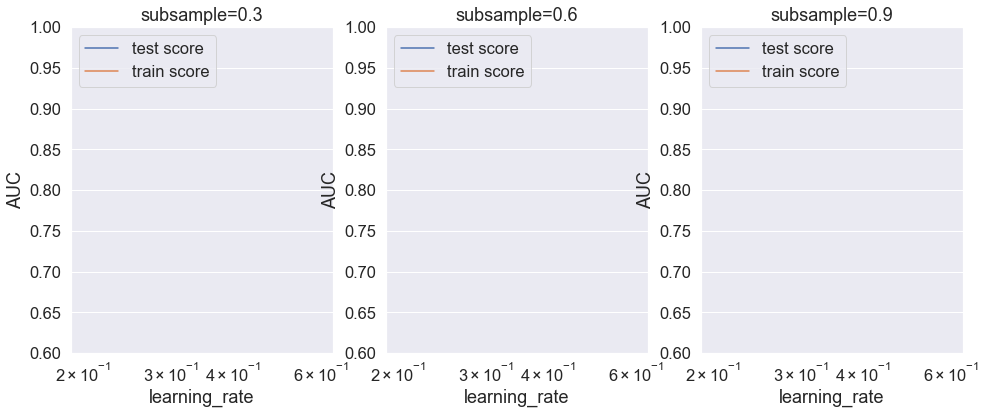

In [276]:
# # plotting
plt.figure(figsize=(16,6))

param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]} 


for n, subsample in enumerate(param_grid['subsample']):
    

    # subplot 1/n
    plt.subplot(1,len(param_grid['subsample']), n+1)
    df = cv_results[cv_results['param_subsample']==subsample]

    plt.plot(df["param_learning_rate"], df["mean_test_score"])
    plt.plot(df["param_learning_rate"], df["mean_train_score"])
    plt.xlabel('learning_rate')
    plt.ylabel('AUC')
    plt.title("subsample={0}".format(subsample))
    plt.ylim([0.60, 1])
    plt.legend(['test score', 'train score'], loc='upper left')
    plt.xscale('log')

##### Model with optimal hyperparameters
We see that the train score almost touches to 1. Among the hyperparameters, we can choose the best parameters as learning_rate : 0.6 and subsample: 0.9

In [277]:
model_cv.best_params_

{'learning_rate': 0.6, 'subsample': 0.6}

In [278]:
# chosen hyperparameters
params = {'learning_rate': 0.6,
          'max_depth': 2, 
          'n_estimators':200,
          'subsample':0.9,
         'objective':'binary:logistic'}

# fit model on training data
xgb_bal_ros_model = XGBClassifier(params = params)
xgb_bal_ros_model.fit(X_train_ros, y_train_ros)

[17:44:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "params" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[17:44:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1,
              params={'learning_rate': 0.6, 'max_depth': 2, 'n_estimators': 200,
                      'objective': 'binary:logistic', 'subsample': 0.9},
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)

##### Prediction on the train set

In [279]:
# Predictions on the train set
y_train_pred = xgb_bal_ros_model.predict(X_train_ros)

In [280]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_train_ros, y_train_ros)
print(confusion)

[[219788      0]
 [     0 219788]]


In [281]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [282]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_train_ros, y_train_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_train_ros, y_train_pred))

Accuracy:- 1.0
Sensitivity:- 1.0
Specificity:- 1.0
F1-Score:- 1.0


In [283]:
# classification_report
print(classification_report(y_train_ros, y_train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    219788
           1       1.00      1.00      1.00    219788

    accuracy                           1.00    439576
   macro avg       1.00      1.00      1.00    439576
weighted avg       1.00      1.00      1.00    439576



In [284]:
# Predicted probability
y_train_pred_proba = xgb_bal_ros_model.predict_proba(X_train_ros)[:,1]

In [285]:
# roc_auc
auc = metrics.roc_auc_score(y_train_ros, y_train_pred_proba)
auc

1.0

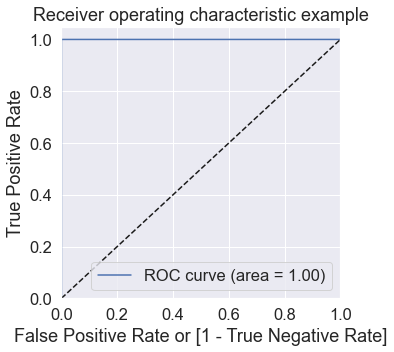

In [286]:
# Plot the ROC curve
draw_roc(y_train_ros, y_train_pred_proba)

##### Prediction on the test set

In [287]:
# Predictions on the test set
y_test_pred = xgb_bal_ros_model.predict(X_test)

In [288]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion)

[[54949     7]
 [   15    73]]


In [289]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [290]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_test, y_test_pred))

Accuracy:- 0.9996003197442046
Sensitivity:- 0.8295454545454546
Specificity:- 0.9998726253730257
F1-Score:- 0.869047619047619


In [291]:
# classification_report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     54956
           1       0.91      0.83      0.87        88

    accuracy                           1.00     55044
   macro avg       0.96      0.91      0.93     55044
weighted avg       1.00      1.00      1.00     55044



In [292]:
# Predicted probability
y_test_pred_proba = xgb_bal_ros_model.predict_proba(X_test)[:,1]

In [293]:
# roc_auc
auc = metrics.roc_auc_score(y_test, y_test_pred_proba)
auc

0.9921253118197036

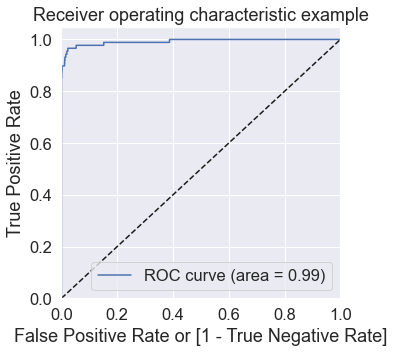

In [294]:
# Plot the ROC curve
draw_roc(y_test, y_test_pred_proba)

***Model summary for Over_Sampling- XG Boost***

- Train set
    - Accuracy = 1.0
    - Sensitivity = 1.0
    - Specificity = 1.0
    - F1 score = 1.0
    - AUC = 1.0
    
- Test set
    - Accuracy = 0.999
    - Sensitivity = 0.841
    - Specificity = 0.999
    - F1 score = 0.865
    - AUC = 0.99

### Decision Tree

In [295]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
}


# Instantiate the grid search model
dtree = DecisionTreeClassifier()

grid_search = GridSearchCV(estimator = dtree, 
                           param_grid = param_grid, 
                           scoring= 'roc_auc',
                           cv = 3, 
                           verbose = 1)

# Fit the grid search to the data
grid_search.fit(X_train_ros,y_train_ros)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:  2.1min finished


GridSearchCV(cv=3, estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': range(5, 15, 5),
                         'min_samples_leaf': range(50, 150, 50),
                         'min_samples_split': range(50, 150, 50)},
             scoring='roc_auc', verbose=1)

In [296]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,4.419041,0.302619,0.067704,7.363167e-03,5,50,50,"{'max_depth': 5, 'min_samples_leaf': 50, 'min_...",0.989320,0.992716,0.992157,0.991398,0.001487,6
1,4.498177,0.250094,0.062495,3.351079e-06,5,50,100,"{'max_depth': 5, 'min_samples_leaf': 50, 'min_...",0.989320,0.992716,0.992166,0.991401,0.001488,5
2,4.245143,0.077929,0.062496,6.836514e-07,5,100,50,"{'max_depth': 5, 'min_samples_leaf': 100, 'min...",0.989214,0.992573,0.992004,0.991264,0.001468,8
3,4.192876,0.027381,0.065586,4.369055e-03,5,100,100,"{'max_depth': 5, 'min_samples_leaf': 100, 'min...",0.989228,0.992573,0.992004,0.991268,0.001461,7
4,5.996349,0.230263,0.062497,5.299118e-06,10,50,50,"{'max_depth': 10, 'min_samples_leaf': 50, 'min...",0.999593,0.999566,0.999512,0.999557,0.000034,2
5,5.842835,0.104376,0.062495,2.545614e-06,10,50,100,"{'max_depth': 10, 'min_samples_leaf': 50, 'min...",0.999579,0.999576,0.999554,0.999570,0.000011,1
6,5.766030,0.150117,0.075098,6.730225e-03,10,100,50,"{'max_depth': 10, 'min_samples_leaf': 100, 'mi...",0.999507,0.999416,0.999388,0.999437,0.000051,4
7,5.901235,0.099397,0.067704,7.363954e-03,10,100,100,"{'max_depth': 10, 'min_samples_leaf': 100, 'mi...",0.999518,0.999416,0.999389,0.999441,0.000055,3


In [297]:
# Printing the optimal sensitivity score and hyperparameters
print("Best roc_auc:-", grid_search.best_score_)
print(grid_search.best_estimator_)

Best roc_auc:- 0.9995696793591776
DecisionTreeClassifier(max_depth=10, min_samples_leaf=50, min_samples_split=100)


In [298]:
# Model with optimal hyperparameters
dt_bal_ros_model = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = 100,
                                  max_depth=10, 
                                  min_samples_leaf=50,
                                  min_samples_split=50)

dt_bal_ros_model.fit(X_train_ros, y_train_ros)

DecisionTreeClassifier(max_depth=10, min_samples_leaf=50, min_samples_split=50,
                       random_state=100)

##### Prediction on the train set

In [299]:
# Predictions on the train set
y_train_pred = dt_bal_ros_model.predict(X_train_ros)

In [300]:
# Predictions on the train set
y_train_pred = dt_bal_ros_model.predict(X_train_ros)

In [301]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [302]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_train_ros, y_train_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_train_ros, y_train_pred))

Accuracy:- 0.99664449378492
Sensitivity:- 0.8295454545454546
Specificity:- 0.9998726253730257
F1-Score:- 0.9966557155521697


In [303]:
# classification_report
print(classification_report(y_train_ros, y_train_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00    219788
           1       0.99      1.00      1.00    219788

    accuracy                           1.00    439576
   macro avg       1.00      1.00      1.00    439576
weighted avg       1.00      1.00      1.00    439576



In [304]:
# Predicted probability
y_train_pred_proba = dt_bal_ros_model.predict_proba(X_train_ros)[:,1]

In [305]:
# roc_auc
auc = metrics.roc_auc_score(y_train_ros, y_train_pred_proba)
auc

0.999673435790654

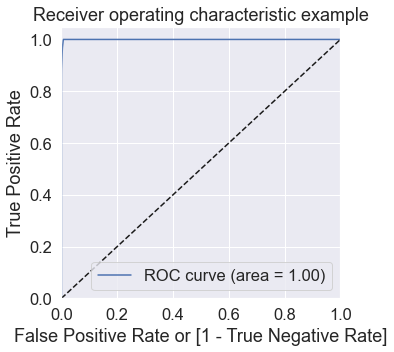

In [306]:
# Plot the ROC curve
draw_roc(y_train_ros, y_train_pred_proba)

##### Prediction on the test set

In [307]:
# Predictions on the test set
y_test_pred = dt_bal_ros_model.predict(X_test)

In [308]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion)

[[54594   362]
 [   14    74]]


In [309]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [310]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_test, y_test_pred))

Accuracy:- 0.9931691010827701
Sensitivity:- 0.8409090909090909
Specificity:- 0.9934129121479002
F1-Score:- 0.2824427480916031


In [311]:
# classification_report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00     54956
           1       0.17      0.84      0.28        88

    accuracy                           0.99     55044
   macro avg       0.58      0.92      0.64     55044
weighted avg       1.00      0.99      1.00     55044



In [312]:
# Predicted probability
y_test_pred_proba = dt_bal_ros_model.predict_proba(X_test)[:,1]

In [313]:
# roc_auc
auc = metrics.roc_auc_score(y_test, y_test_pred_proba)
auc

0.9198034047072369

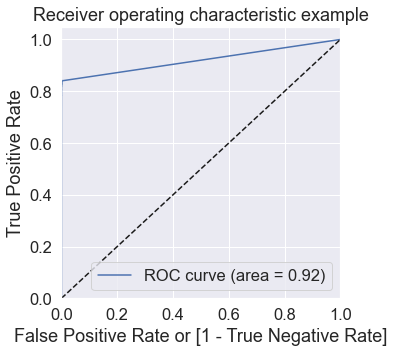

In [314]:
# Plot the ROC curve
draw_roc(y_test, y_test_pred_proba)

***Model summary for Over_Sampling- Decision Tree***

- Train set
    - Accuracy = 0.996
    - Sensitivity = 0.841
    - Specificity = 0.999
    - F1 score = 0.996
    - AUC = 1.0
    
- Test set
    - Accuracy = 0.992
    - Sensitivity = 0.829
    - Specificity = 0.992
    - F1 score = 0.261
    - AUC = 0.91

## SMOTE (Synthetic Minority Oversampling Technique)


We are creating synthetic samples by doing upsampling using SMOTE(Synthetic Minority Oversampling Technique).

In [315]:
# Importing SMOTE
from imblearn.over_sampling import SMOTE

In [316]:
# Instantiate SMOTE
sm = SMOTE(random_state=27)
# Fitting SMOTE to the train set
X_train_smote, y_train_smote = sm.fit_sample(X_train, y_train)

In [317]:
print('Before SMOTE oversampling X_train shape=',X_train.shape)
print('After SMOTE oversampling X_train shape=',X_train_smote.shape)

Before SMOTE oversampling X_train shape= (220173, 29)
After SMOTE oversampling X_train shape= (439576, 29)


### Logistic Regression

In [318]:
# Creating KFold object with 5 splits
folds = KFold(n_splits=5, shuffle=True, random_state=4)

# Specify params
params = {"C": [0.01, 0.1, 1, 10, 100, 1000]}

# Specifing score as roc-auc
model_cv = GridSearchCV(estimator = LogisticRegression(),
                        param_grid = params, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True) 

# Fit the model
model_cv.fit(X_train_smote, y_train_smote)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:  1.1min finished


GridSearchCV(cv=KFold(n_splits=5, random_state=4, shuffle=True),
             estimator=LogisticRegression(),
             param_grid={'C': [0.01, 0.1, 1, 10, 100, 1000]},
             return_train_score=True, scoring='roc_auc', verbose=1)

In [319]:
# results of grid search CV
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.838264,0.089913,0.040623,0.007655,0.01,{'C': 0.01},0.988878,0.988926,0.989352,0.988811,0.988876,0.988969,0.000195,6,0.989018,0.988964,0.988920,0.988990,0.989015,0.988981,0.000036
1,1.857351,0.054268,0.044080,0.006447,0.1,{'C': 0.1},0.988918,0.988961,0.989389,0.988852,0.988908,0.989006,0.000195,5,0.989051,0.989001,0.988962,0.989032,0.989046,0.989018,0.000033
2,2.191420,0.263888,0.045847,0.004720,1,{'C': 1},0.988920,0.988963,0.989392,0.988855,0.988908,0.989008,0.000195,4,0.989052,0.989003,0.988965,0.989034,0.989046,0.989020,0.000032
3,1.959215,0.069976,0.042611,0.006092,10,{'C': 10},0.988920,0.988963,0.989392,0.988855,0.988908,0.989008,0.000195,3,0.989052,0.989003,0.988965,0.989035,0.989047,0.989020,0.000032
4,1.839111,0.049846,0.034372,0.006251,100,{'C': 100},0.988920,0.988963,0.989392,0.988855,0.988908,0.989008,0.000195,2,0.989052,0.989003,0.988965,0.989035,0.989047,0.989020,0.000032
5,1.887979,0.083445,0.037420,0.006988,1000,{'C': 1000},0.988920,0.988963,0.989392,0.988855,0.988908,0.989008,0.000195,1,0.989052,0.989003,0.988965,0.989035,0.989047,0.989020,0.000032


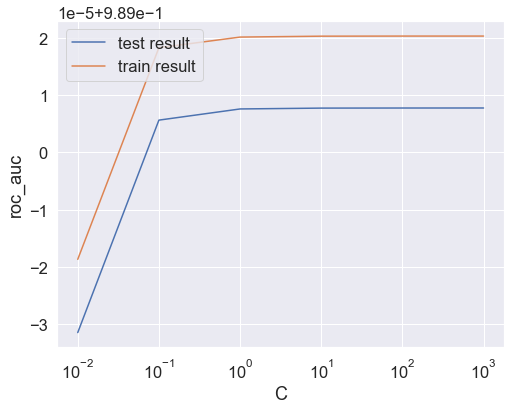

In [320]:
# plot of C versus train and validation scores

plt.figure(figsize=(8, 6))
plt.plot(cv_results['param_C'], cv_results['mean_test_score'])
plt.plot(cv_results['param_C'], cv_results['mean_train_score'])
plt.xlabel('C')
plt.ylabel('roc_auc')
plt.legend(['test result', 'train result'], loc='upper left')
plt.xscale('log')

In [321]:
# Best score with best C
best_score = model_cv.best_score_
best_C = model_cv.best_params_['C']

print(" The highest test roc_auc is {0} at C = {1}".format(best_score, best_C))

 The highest test roc_auc is 0.9890077576799836 at C = 1000


In [322]:
#### Logistic regression with optimal C

In [323]:
# Instantiate the model with best C
logistic_bal_smote = LogisticRegression(C=1000)

In [324]:
# Fit the model on the train set
logistic_bal_smote_model = logistic_bal_smote.fit(X_train_smote, y_train_smote)

##### Prediction on the train set

In [325]:
# Predictions on the train set
y_train_pred = logistic_bal_smote_model.predict(X_train_smote)

In [326]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_train_smote, y_train_pred)
print(confusion)

[[212789   6999]
 [ 18514 201274]]


In [327]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [328]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_train_smote, y_train_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_train_smote, y_train_pred))

Accuracy:- 0.9419599796167216
Sensitivity:- 0.9157642819444192
Specificity:- 0.968155677289024
F1-Score:- 0.9403986814963288


In [329]:
# classification_report
print(classification_report(y_train_smote, y_train_pred))

              precision    recall  f1-score   support

           0       0.92      0.97      0.94    219788
           1       0.97      0.92      0.94    219788

    accuracy                           0.94    439576
   macro avg       0.94      0.94      0.94    439576
weighted avg       0.94      0.94      0.94    439576



In [330]:
# Predicted probability
y_train_pred_proba_log_bal_smote = logistic_bal_smote_model.predict_proba(X_train_smote)[:,1]

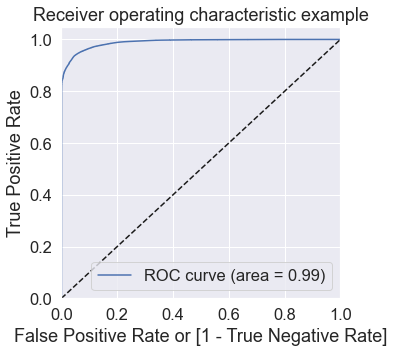

In [331]:
# Plot the ROC curve
draw_roc(y_train_smote, y_train_pred_proba_log_bal_smote)

#### Prediction on the test set

In [332]:
# Prediction on the test set
y_test_pred = logistic_bal_smote_model.predict(X_test)

In [333]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion)

[[53211  1745]
 [    5    83]]


In [334]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [335]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_test, y_test_pred))

Accuracy:- 0.9682072523799142
Sensitivity:- 0.9431818181818182
Specificity:- 0.9682473251328335
F1-Score:- 0.08663883089770355


In [336]:
# classification_report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       1.00      0.97      0.98     54956
           1       0.05      0.94      0.09        88

    accuracy                           0.97     55044
   macro avg       0.52      0.96      0.54     55044
weighted avg       1.00      0.97      0.98     55044



##### ROC on the test set

In [337]:
# Predicted probability
y_test_pred_proba = logistic_bal_smote_model.predict_proba(X_test)[:,1]

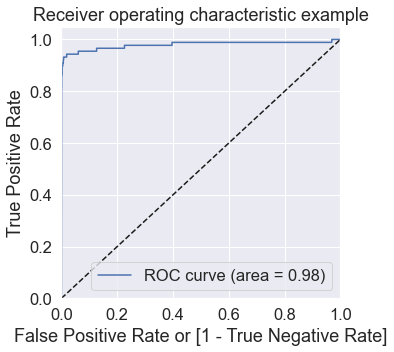

In [338]:
# Plot the ROC curve
draw_roc(y_test, y_test_pred_proba)

***Model summary for Smote- Logistic Regression***

- Train set
    - Accuracy = 0.942
    - Sensitivity = 0.916
    - Specificity = 0.968
    - F1 score = 0.940
    - AUC = 0.99
    
- Test set
    - Accuracy = 0.968
    - Sensitivity = 0.943
    - Specificity = 0.968
    - F1 score = 0.087
    - AUC = 0.98

### XGBoost

In [339]:
# hyperparameter tuning with XGBoost

# creating a KFold object 
folds = 3

# specify range of hyperparameters
param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]}          


# specify model
xgb_model = XGBClassifier(max_depth=2, n_estimators=200)

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = xgb_model, 
                        param_grid = param_grid, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)      

# fit the model
model_cv.fit(X_train_smote, y_train_smote)       

Fitting 3 folds for each of 6 candidates, totalling 18 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[17:50:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:51:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:52:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:53:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[Parallel(n_jobs=1)]: Done  18 out of  18 | elapsed: 24.7min finished


[18:15:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=2, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=200, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None, va

In [340]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,59.398011,0.864890,0.276418,0.019342,0.2,0.3,"{'learning_rate': 0.2, 'subsample': 0.3}",0.999629,0.999507,0.999531,0.999555,0.000053,4,0.999598,0.999612,0.999582,0.999598,0.000012
1,83.825771,1.026746,0.255328,0.016964,0.2,0.6,"{'learning_rate': 0.2, 'subsample': 0.6}",0.999611,0.999473,0.999552,0.999545,0.000057,5,0.999594,0.999596,0.999603,0.999598,0.000004
2,102.378197,0.731327,0.246340,0.009450,0.2,0.9,"{'learning_rate': 0.2, 'subsample': 0.9}",0.999569,0.999472,0.999492,0.999511,0.000042,6,0.999542,0.999599,0.999560,0.999567,0.000024
3,58.911255,0.510143,0.237080,0.017584,0.6,0.3,"{'learning_rate': 0.6, 'subsample': 0.3}",0.999932,0.999886,0.999925,0.999914,0.000020,3,0.999953,0.999958,0.999965,0.999959,0.000005
4,82.749372,0.673545,0.246559,0.017245,0.6,0.6,"{'learning_rate': 0.6, 'subsample': 0.6}",0.999946,0.999913,0.999945,0.999935,0.000015,1,0.999958,0.999970,0.999968,0.999966,0.000005
5,102.326869,0.892652,0.243627,0.016581,0.6,0.9,"{'learning_rate': 0.6, 'subsample': 0.9}",0.999951,0.999906,0.999945,0.999934,0.000020,2,0.999965,0.999976,0.999964,0.999968,0.000005


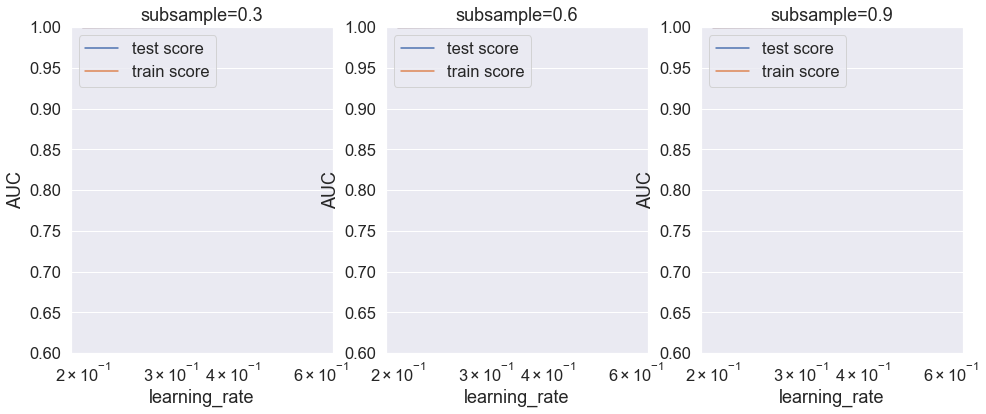

In [341]:
# # plotting
plt.figure(figsize=(16,6))

param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]} 


for n, subsample in enumerate(param_grid['subsample']):
    

    # subplot 1/n
    plt.subplot(1,len(param_grid['subsample']), n+1)
    df = cv_results[cv_results['param_subsample']==subsample]

    plt.plot(df["param_learning_rate"], df["mean_test_score"])
    plt.plot(df["param_learning_rate"], df["mean_train_score"])
    plt.xlabel('learning_rate')
    plt.ylabel('AUC')
    plt.title("subsample={0}".format(subsample))
    plt.ylim([0.60, 1])
    plt.legend(['test score', 'train score'], loc='upper left')
    plt.xscale('log')

##### Model with optimal hyperparameters
We see that the train score almost touches to 1. Among the hyperparameters, we can choose the best parameters as learning_rate : 0.6 and subsample: 0.6

In [342]:
model_cv.best_params_

{'learning_rate': 0.6, 'subsample': 0.6}

In [343]:
# chosen hyperparameters
# 'objective':'binary:logistic' outputs probability rather than label, which we need for calculating auc
params = {'learning_rate': 0.6,
          'max_depth': 2, 
          'n_estimators':200,
          'subsample':0.6,
         'objective':'binary:logistic'}

# fit model on training data
xgb_bal_smote_model = XGBClassifier(params = params)
xgb_bal_smote_model.fit(X_train_smote, y_train_smote)

[18:17:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "params" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[18:17:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1,
              params={'learning_rate': 0.6, 'max_depth': 2, 'n_estimators': 200,
                      'objective': 'binary:logistic', 'subsample': 0.6},
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)

##### Prediction on the train set

In [344]:
# Predictions on the train set
y_train_pred = xgb_bal_smote_model.predict(X_train_smote)

In [345]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_train_smote, y_train_pred)
print(confusion)

[[219784      4]
 [     0 219788]]


In [346]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [362]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_train_smote, y_train_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_train_smote, y_train_pred))

Accuracy:- 0.9999909003221286
Sensitivity:- 0.8522727272727273
Specificity:- 0.9995632869932309
F1-Score:- 0.999990900404932


In [348]:
# classification_report
print(classification_report(y_train_smote, y_train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    219788
           1       1.00      1.00      1.00    219788

    accuracy                           1.00    439576
   macro avg       1.00      1.00      1.00    439576
weighted avg       1.00      1.00      1.00    439576



In [349]:
# Predicted probability
y_train_pred_proba = xgb_bal_smote_model.predict_proba(X_train_smote)[:,1]

In [350]:
# roc_auc
auc = metrics.roc_auc_score(y_train_smote, y_train_pred_proba)
auc

1.0

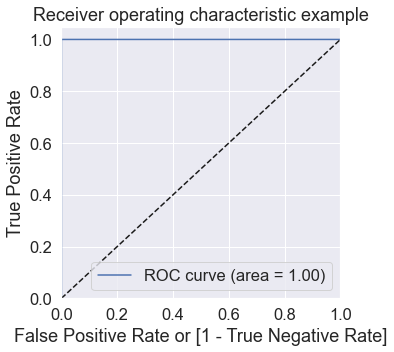

In [351]:
# Plot the ROC curve
draw_roc(y_train_smote, y_train_pred_proba)

In [352]:
##### Prediction on the test set

In [353]:
# Predictions on the test set
y_test_pred = xgb_bal_smote_model.predict(X_test)

In [354]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion)

[[54932    24]
 [   13    75]]


In [355]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [356]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_test, y_test_pred))

Accuracy:- 0.9993278104788896
Sensitivity:- 0.8522727272727273
Specificity:- 0.9995632869932309
F1-Score:- 0.8021390374331552


In [357]:
# classification_report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     54956
           1       0.76      0.85      0.80        88

    accuracy                           1.00     55044
   macro avg       0.88      0.93      0.90     55044
weighted avg       1.00      1.00      1.00     55044



In [358]:
# Predicted probability
y_test_pred_proba = xgb_bal_smote_model.predict_proba(X_test)[:,1]

In [359]:
# roc_auc
auc = metrics.roc_auc_score(y_test, y_test_pred_proba)
auc

0.9860488597489561

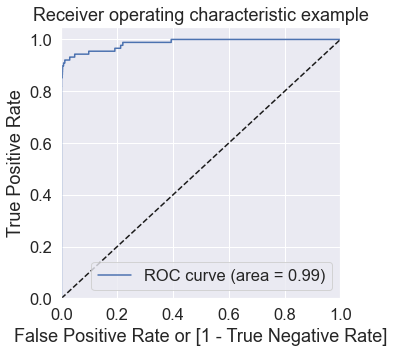

In [360]:
# Plot the ROC curve
draw_roc(y_test, y_test_pred_proba)

***Model summary for Smote- XG Boost***

- Train set
    - Accuracy = 0.999
    - Sensitivity = 0.852
    - Specificity = 0.999
    - F1 score = 0.999
    - AUC = 1.0
    
- Test set
    - Accuracy = 0.999
    - Sensitivity = 0.852
    - Specificity = 0.999
    - F1 score = 0.802
    - AUC = 0.99

### Decision Tree

In [363]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
}


# Instantiate the grid search model
dtree = DecisionTreeClassifier()

grid_search = GridSearchCV(estimator = dtree, 
                           param_grid = param_grid, 
                           scoring= 'roc_auc',
                           cv = 3, 
                           verbose = 1)

# Fit the grid search to the data
grid_search.fit(X_train_smote,y_train_smote)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:  4.0min finished


GridSearchCV(cv=3, estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': range(5, 15, 5),
                         'min_samples_leaf': range(50, 150, 50),
                         'min_samples_split': range(50, 150, 50)},
             scoring='roc_auc', verbose=1)

In [364]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,7.335476,0.753389,0.078954,0.023278,5,50,50,"{'max_depth': 5, 'min_samples_leaf': 50, 'min_...",0.983695,0.983180,0.983245,0.983373,0.000229,6
1,7.251286,0.505425,0.073661,0.015786,5,50,100,"{'max_depth': 5, 'min_samples_leaf': 50, 'min_...",0.983695,0.983177,0.983249,0.983373,0.000229,5
2,8.197907,0.546437,0.076824,0.010642,5,100,50,"{'max_depth': 5, 'min_samples_leaf': 100, 'min...",0.983618,0.983091,0.983177,0.983295,0.000231,7
3,7.342784,0.137649,0.062724,0.001228,5,100,100,"{'max_depth': 5, 'min_samples_leaf': 100, 'min...",0.983618,0.983091,0.983177,0.983295,0.000231,7
4,12.368224,0.100783,0.067702,0.007367,10,50,50,"{'max_depth': 10, 'min_samples_leaf': 50, 'min...",0.997510,0.997163,0.997318,0.997331,0.000142,3
5,12.302316,0.037191,0.067705,0.007365,10,50,100,"{'max_depth': 10, 'min_samples_leaf': 50, 'min...",0.997545,0.997165,0.997331,0.997347,0.000155,1
6,12.249410,0.025517,0.072911,0.007364,10,100,50,"{'max_depth': 10, 'min_samples_leaf': 100, 'mi...",0.997515,0.997138,0.997332,0.997328,0.000154,4
7,12.437889,0.162590,0.093745,0.022096,10,100,100,"{'max_depth': 10, 'min_samples_leaf': 100, 'mi...",0.997549,0.997162,0.997324,0.997345,0.000159,2


In [365]:
# Printing the optimal sensitivity score and hyperparameters
print("Best roc_auc:-", grid_search.best_score_)
print(grid_search.best_estimator_)

Best roc_auc:- 0.9973467424567376
DecisionTreeClassifier(max_depth=10, min_samples_leaf=50, min_samples_split=100)


In [366]:
# Model with optimal hyperparameters
dt_bal_smote_model = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = 100,
                                  max_depth=10, 
                                  min_samples_leaf=50,
                                  min_samples_split=100)

dt_bal_smote_model.fit(X_train_smote, y_train_smote)

DecisionTreeClassifier(max_depth=10, min_samples_leaf=50, min_samples_split=100,
                       random_state=100)

##### Prediction on the train set

In [367]:
# Predictions on the train set
y_train_pred = dt_bal_smote_model.predict(X_train_smote)

In [368]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_train_smote, y_train_pred)
print(confusion)

[[214780   5008]
 [  1844 217944]]


In [369]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [370]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_train_smote, y_train_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_train_smote, y_train_pred))

Accuracy:- 0.9844122518062861
Sensitivity:- 0.9916100970025661
Specificity:- 0.977214406610006
F1-Score:- 0.9845236481908116


In [371]:
# classification_report
print(classification_report(y_train_smote, y_train_pred))

              precision    recall  f1-score   support

           0       0.99      0.98      0.98    219788
           1       0.98      0.99      0.98    219788

    accuracy                           0.98    439576
   macro avg       0.98      0.98      0.98    439576
weighted avg       0.98      0.98      0.98    439576



In [372]:
# Predicted probability
y_train_pred_proba = dt_bal_smote_model.predict_proba(X_train_smote)[:,1]

In [373]:
# roc_auc
auc = metrics.roc_auc_score(y_train_smote, y_train_pred_proba)
auc

0.9979445245171126

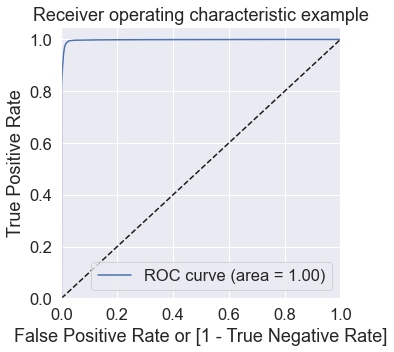

In [374]:
# Plot the ROC curve
draw_roc(y_train_smote, y_train_pred_proba)

##### Prediction on the test set

In [375]:
# Predictions on the test set
y_test_pred = dt_bal_smote_model.predict(X_test)

In [376]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion)

[[53623  1333]
 [   14    74]]


In [377]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [378]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_test, y_test_pred))

Accuracy:- 0.9755286679747112
Sensitivity:- 0.8409090909090909
Specificity:- 0.9757442317490356
F1-Score:- 0.09899665551839465


In [379]:
# classification_report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99     54956
           1       0.05      0.84      0.10        88

    accuracy                           0.98     55044
   macro avg       0.53      0.91      0.54     55044
weighted avg       1.00      0.98      0.99     55044



In [380]:
# Predicted probability
y_test_pred_proba = dt_bal_smote_model.predict_proba(X_test)[:,1]

In [381]:
# roc_auc
auc = metrics.roc_auc_score(y_test, y_test_pred_proba)
auc

0.9260676102865764

In [469]:
print('Train auc =', metrics.roc_auc_score(y_train_adasyn, y_train_pred_proba))
fpr, tpr, thresholds = metrics.roc_curve(y_train_adasyn, y_train_pred_proba)
threshold = thresholds[np.argmax(tpr-fpr)]
print("Threshold=",threshold)

Train auc = 1.0
Threshold= 0.87872046


In [ ]:
print('Test auc =', metrics.roc_auc_score(y_test, y_test_pred_proba))
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_test_pred_proba)
threshold = thresholds[np.argmax(tpr-fpr)]
print("Threshold =",threshold)

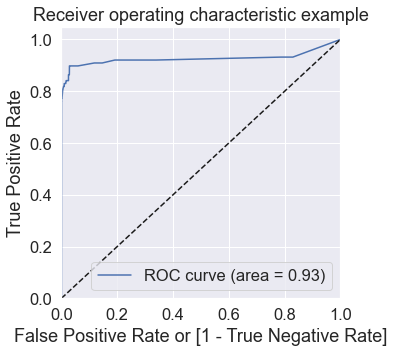

In [382]:
# Plot the ROC curve
draw_roc(y_test, y_test_pred_proba)

***Model summary for Smote- Decision Tree***

- Train set
    - Accuracy = 0.984
    - Sensitivity = 0.991
    - Specificity = 0.997
    - F1 score = 0.984
    - AUC = 1.0
    
- Test set
    - Accuracy = 0.975
    - Sensitivity = 0.841
    - Specificity = 0.976
    - F1 score = 0.099
    - AUC = 0.93

## AdaSyn (Adaptive Synthetic Sampling)

In [383]:
# Importing adasyn
from imblearn.over_sampling import ADASYN

In [384]:
# Instantiate adasyn
ada = ADASYN(random_state=0)
X_train_adasyn, y_train_adasyn = ada.fit_resample(X_train, y_train)

In [385]:
# Befor sampling class distribution
print('Before sampling class distribution:-',Counter(y_train))
# new class distribution 
print('New class distribution:-',Counter(y_train_adasyn))

Before sampling class distribution:- Counter({0: 219788, 1: 385})
New class distribution:- Counter({0: 219788, 1: 219750})


### Logistic Regression

In [406]:
# Creating KFold object with 3 splits
folds = KFold(n_splits=3, shuffle=True, random_state=4)

# Specify params
params = {"C": [0.01, 0.1, 1, 2, 10, 100, 1000 ]}

# Specifing score as roc-auc
model_cv = GridSearchCV(estimator = LogisticRegression(),
                        param_grid = params, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True) 

# Fit the model
model_cv.fit(X_train_adasyn, y_train_adasyn)

Fitting 3 folds for each of 7 candidates, totalling 21 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  21 out of  21 | elapsed:   34.2s finished


GridSearchCV(cv=KFold(n_splits=3, random_state=4, shuffle=True),
             estimator=LogisticRegression(),
             param_grid={'C': [0.01, 0.1, 1, 2, 10, 100, 1000]},
             return_train_score=True, scoring='roc_auc', verbose=1)

In [407]:
# results of grid search CV
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,1.362555,0.080963,0.065662,0.004477,0.01,{'C': 0.01},0.961313,0.961742,0.961225,0.961427,0.000226,7,0.961539,0.961270,0.961534,0.961447,0.000126
1,1.416868,0.039332,0.065480,0.004215,0.1,{'C': 0.1},0.961439,0.961857,0.961355,0.961551,0.000219,6,0.961648,0.961416,0.961655,0.961573,0.000111
2,1.400977,0.036827,0.062495,0.000003,1,{'C': 1},0.961449,0.961864,0.961363,0.961559,0.000219,5,0.961654,0.961427,0.961663,0.961581,0.000109
3,1.459459,0.059047,0.068379,0.008311,2,{'C': 2},0.961449,0.961865,0.961363,0.961559,0.000219,4,0.961654,0.961428,0.961663,0.961582,0.000109
4,1.416919,0.039397,0.067705,0.007369,10,{'C': 10},0.961450,0.961865,0.961364,0.961559,0.000219,3,0.961654,0.961428,0.961664,0.961582,0.000109
5,1.462544,0.037498,0.067708,0.007366,100,{'C': 100},0.961450,0.961865,0.961364,0.961560,0.000219,2,0.961655,0.961429,0.961664,0.961582,0.000109
6,1.395769,0.077948,0.062496,0.000005,1000,{'C': 1000},0.961450,0.961865,0.961364,0.961560,0.000219,1,0.961655,0.961429,0.961664,0.961582,0.000109


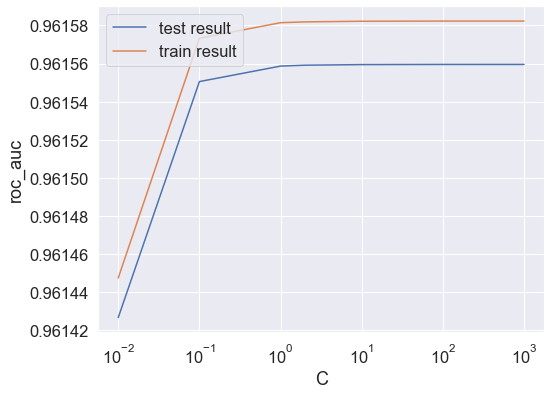

In [408]:
# plot of C versus train and validation scores

plt.figure(figsize=(8, 6))
plt.plot(cv_results['param_C'], cv_results['mean_test_score'])
plt.plot(cv_results['param_C'], cv_results['mean_train_score'])
plt.xlabel('C')
plt.ylabel('roc_auc')
plt.legend(['test result', 'train result'], loc='upper left')
plt.xscale('log')

In [409]:
# Best score with best C
best_score = model_cv.best_score_
best_C = model_cv.best_params_['C']

print(" The highest test roc_auc is {0} at C = {1}".format(best_score, best_C))

 The highest test roc_auc is 0.961559525933882 at C = 1000


#### Logistic regression with optimal C

In [410]:
# Instantiate the model with best C
logistic_bal_adasyn = LogisticRegression(C=2)

In [411]:
# Fit the model on the train set
logistic_bal_adasyn_model = logistic_bal_adasyn.fit(X_train_adasyn, y_train_adasyn)

##### Prediction on the train set

In [412]:
# Predictions on the train set
y_train_pred = logistic_bal_adasyn_model.predict(X_train_adasyn)

In [413]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_train_adasyn, y_train_pred)
print(confusion)

[[198465  21323]
 [ 27010 192740]]


In [414]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [415]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_train_adasyn, y_train_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_train_adasyn, y_train_pred))

Accuracy:- 0.8900368113792209
Sensitivity:- 0.8770875995449374
Specificity:- 0.9029837843740331
F1-Score:- 0.8885856348242215


In [416]:
# classification_report
print(classification_report(y_train_adasyn, y_train_pred))

              precision    recall  f1-score   support

           0       0.88      0.90      0.89    219788
           1       0.90      0.88      0.89    219750

    accuracy                           0.89    439538
   macro avg       0.89      0.89      0.89    439538
weighted avg       0.89      0.89      0.89    439538



In [417]:
# Predicted probability
y_train_pred_proba = logistic_bal_adasyn_model.predict_proba(X_train_adasyn)[:,1]

In [418]:
# roc_auc
auc = metrics.roc_auc_score(y_train_adasyn, y_train_pred_proba)
auc

0.9615839359463012

In [469]:
print('Train auc =', metrics.roc_auc_score(y_train_adasyn, y_train_pred_proba))
fpr, tpr, thresholds = metrics.roc_curve(y_train_adasyn, y_train_pred_proba)
threshold = thresholds[np.argmax(tpr-fpr)]
print("Threshold=",threshold)

Train auc = 1.0
Threshold= 0.87872046


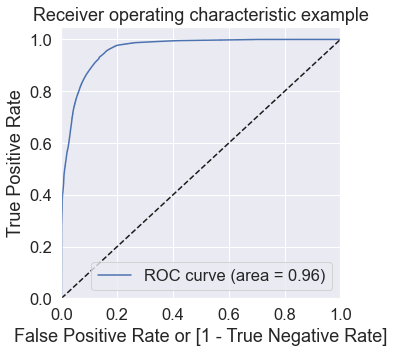

In [419]:
# Plot the ROC curve
draw_roc(y_train_adasyn, y_train_pred_proba)

#### Prediction on the test set

In [420]:
# Prediction on the test set
y_test_pred = logistic_bal_adasyn_model.predict(X_test)

In [421]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion)

[[49631  5325]
 [    3    85]]


In [422]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [423]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_test, y_test_pred))

Accuracy:- 0.9032047089601046
Sensitivity:- 0.9659090909090909
Specificity:- 0.9031043016231167
F1-Score:- 0.030920334667151696


In [424]:
# classification_report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       1.00      0.90      0.95     54956
           1       0.02      0.97      0.03        88

    accuracy                           0.90     55044
   macro avg       0.51      0.93      0.49     55044
weighted avg       1.00      0.90      0.95     55044



In [425]:
# Predicted probability
y_test_pred_proba = logistic_bal_adasyn_model.predict_proba(X_test)[:,1]

In [426]:
# roc_auc
auc = metrics.roc_auc_score(y_test, y_test_pred_proba)
auc

0.9768929813272105

In [ ]:
print('Test auc =', metrics.roc_auc_score(y_test, y_test_pred_proba))
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_test_pred_proba)
threshold = thresholds[np.argmax(tpr-fpr)]
print("Threshold =",threshold)

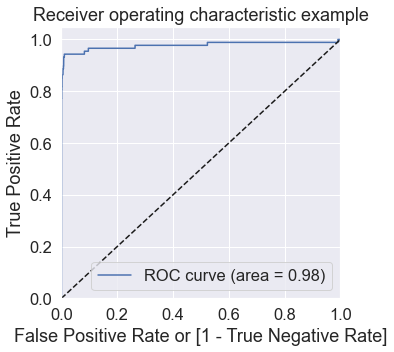

In [427]:
# Plot the ROC curve
draw_roc(y_test, y_test_pred_proba)

***Model summary for AdaSyn - Logistic Regression***

- Train set
    - Accuracy = 0.890
    - Sensitivity = 0.877
    - Specificity = 0.903
    - F1 score = 0.888
    - AUC = 0.96
    
- Test set
    - Accuracy = 0.903
    - Sensitivity = 0.966
    - Specificity = 0.903
    - F1 score = 0.031
    - AUC = 0.98

### Decision Tree

In [428]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
}


# Instantiate the grid search model
dtree = DecisionTreeClassifier()

grid_search = GridSearchCV(estimator = dtree, 
                           param_grid = param_grid, 
                           scoring= 'roc_auc',
                           cv = 3, 
                           verbose = 1)

# Fit the grid search to the data
grid_search.fit(X_train_adasyn,y_train_adasyn)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:  3.7min finished


GridSearchCV(cv=3, estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': range(5, 15, 5),
                         'min_samples_leaf': range(50, 150, 50),
                         'min_samples_split': range(50, 150, 50)},
             scoring='roc_auc', verbose=1)

In [429]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,6.604471,0.106800,0.078123,0.012757,5,50,50,"{'max_depth': 5, 'min_samples_leaf': 50, 'min_...",0.933262,0.894641,0.928979,0.918961,0.017285,1
1,6.572599,0.044802,0.062498,0.000002,5,50,100,"{'max_depth': 5, 'min_samples_leaf': 50, 'min_...",0.933262,0.894641,0.928971,0.918958,0.017284,2
2,6.504892,0.014732,0.062498,0.000002,5,100,50,"{'max_depth': 5, 'min_samples_leaf': 100, 'min...",0.933244,0.894623,0.928950,0.918939,0.017283,4
3,7.304463,0.294587,0.079172,0.011495,5,100,100,"{'max_depth': 5, 'min_samples_leaf': 100, 'min...",0.933250,0.894623,0.928950,0.918941,0.017285,3
4,11.476043,0.392950,0.098953,0.032102,10,50,50,"{'max_depth': 10, 'min_samples_leaf': 50, 'min...",0.902060,0.878322,0.931974,0.904118,0.021952,8
5,11.474617,0.479244,0.062497,0.000002,10,50,100,"{'max_depth': 10, 'min_samples_leaf': 50, 'min...",0.901915,0.881959,0.931309,0.905061,0.020269,7
6,11.383222,0.394123,0.083334,0.019490,10,100,50,"{'max_depth': 10, 'min_samples_leaf': 100, 'mi...",0.918136,0.885659,0.935437,0.913077,0.020634,6
7,11.465354,0.347960,0.062499,0.000004,10,100,100,"{'max_depth': 10, 'min_samples_leaf': 100, 'mi...",0.920008,0.887795,0.933328,0.913710,0.019115,5


In [430]:
# Printing the optimal sensitivity score and hyperparameters
print("Best roc_auc:-", grid_search.best_score_)
print(grid_search.best_estimator_)

Best roc_auc:- 0.9189608793879533
DecisionTreeClassifier(max_depth=5, min_samples_leaf=50, min_samples_split=50)


In [431]:
# Model with optimal hyperparameters
dt_bal_adasyn_model = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = 100,
                                  max_depth=5, 
                                  min_samples_leaf=50,
                                  min_samples_split=50)

dt_bal_adasyn_model.fit(X_train_adasyn, y_train_adasyn)

DecisionTreeClassifier(max_depth=5, min_samples_leaf=50, min_samples_split=50,
                       random_state=100)

##### Prediction on the train set

In [432]:
# Predictions on the train set
y_train_pred = dt_bal_adasyn_model.predict(X_train_adasyn)

In [433]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_train_adasyn, y_train_pred)
print(confusion)

[[192977  26811]
 [ 10947 208803]]


In [434]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [435]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_train_adasyn, y_train_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_train_adasyn, y_train_pred))

Accuracy:- 0.9140961646092033
Sensitivity:- 0.950184300341297
Specificity:- 0.8780142682949024
F1-Score:- 0.9170817192399926


In [436]:
# classification_report
print(classification_report(y_train_adasyn, y_train_pred))

              precision    recall  f1-score   support

           0       0.95      0.88      0.91    219788
           1       0.89      0.95      0.92    219750

    accuracy                           0.91    439538
   macro avg       0.92      0.91      0.91    439538
weighted avg       0.92      0.91      0.91    439538



In [437]:
# Predicted probability
y_train_pred_proba = dt_bal_adasyn_model.predict_proba(X_train_adasyn)[:,1]

In [438]:
# roc_auc
auc = metrics.roc_auc_score(y_train_adasyn, y_train_pred_proba)
auc

0.9480282207202129

In [469]:
print('Train auc =', metrics.roc_auc_score(y_train_adasyn, y_train_pred_proba))
fpr, tpr, thresholds = metrics.roc_curve(y_train_adasyn, y_train_pred_proba)
threshold = thresholds[np.argmax(tpr-fpr)]
print("Threshold=",threshold)

Train auc = 1.0
Threshold= 0.87872046


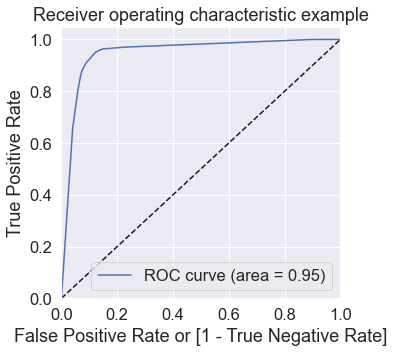

In [439]:
# Plot the ROC curve
draw_roc(y_train_adasyn, y_train_pred_proba)

##### Prediction on the test set

In [440]:
# Predictions on the test set
y_test_pred = dt_bal_adasyn_model.predict(X_test)

In [441]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion)

[[48361  6595]
 [    4    84]]


In [442]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [443]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_test, y_test_pred))

Accuracy:- 0.8801140905457452
Sensitivity:- 0.9545454545454546
Specificity:- 0.8799949050149211
F1-Score:- 0.02482636323333826


In [444]:
# classification_report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       1.00      0.88      0.94     54956
           1       0.01      0.95      0.02        88

    accuracy                           0.88     55044
   macro avg       0.51      0.92      0.48     55044
weighted avg       1.00      0.88      0.93     55044



In [445]:
# Predicted probability
y_test_pred_proba = dt_bal_adasyn_model.predict_proba(X_test)[:,1]

In [446]:
# roc_auc
auc = metrics.roc_auc_score(y_test, y_test_pred_proba)
auc

0.9585146422923463

In [ ]:
print('Test auc =', metrics.roc_auc_score(y_test, y_test_pred_proba))
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_test_pred_proba)
threshold = thresholds[np.argmax(tpr-fpr)]
print("Threshold =",threshold)

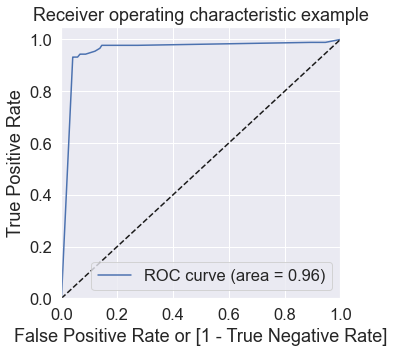

In [447]:
# Plot the ROC curve
draw_roc(y_test, y_test_pred_proba)

***Model summary for AdaSyn - Decision Tree***

- Train set
    - Accuracy = 0.914
    - Sensitivity = 0.950
    - Specificity = 0.878
    - F1 score = 0.917
    - AUC = 0.95
    
- Test set
    - Accuracy = 0.880
    - Sensitivity = 0.954
    - Specificity = 0.880
    - F1 score = 0.025
    - AUC = 0.96

### XGBoost

In [448]:
# hyperparameter tuning with XGBoost

# creating a KFold object 
folds = 3

# specify range of hyperparameters
param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]}          


# specify model
xgb_model = XGBClassifier(max_depth=2, n_estimators=200)

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = xgb_model, 
                        param_grid = param_grid, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)      

# fit the model
model_cv.fit(X_train_adasyn, y_train_adasyn)       

Fitting 3 folds for each of 6 candidates, totalling 18 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[21:44:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:45:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:46:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:47:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[Parallel(n_jobs=1)]: Done  18 out of  18 | elapsed: 24.0min finished


[22:09:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=2, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=200, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None, va

In [449]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,56.273212,0.660452,0.244780,0.014730,0.2,0.3,"{'learning_rate': 0.2, 'subsample': 0.3}",0.967548,0.984823,0.985438,0.979270,0.008292,4,0.998897,0.999250,0.998693,0.998947,0.000230
1,80.319997,0.560758,0.231129,0.003167,0.2,0.6,"{'learning_rate': 0.2, 'subsample': 0.6}",0.967993,0.983342,0.982804,0.978046,0.007112,5,0.998946,0.999154,0.998694,0.998932,0.000188
2,100.708719,1.061945,0.239659,0.013094,0.2,0.9,"{'learning_rate': 0.2, 'subsample': 0.9}",0.963339,0.983445,0.981522,0.976102,0.009059,6,0.998774,0.999174,0.998713,0.998887,0.000205
3,56.194699,0.849723,0.232880,0.017045,0.6,0.3,"{'learning_rate': 0.6, 'subsample': 0.3}",0.982348,0.990538,0.982881,0.985256,0.003741,1,0.999913,0.999912,0.999892,0.999905,0.000010
4,80.885287,1.057024,0.244745,0.009219,0.6,0.6,"{'learning_rate': 0.6, 'subsample': 0.6}",0.978233,0.987164,0.989001,0.984799,0.004703,2,0.999944,0.999912,0.999891,0.999916,0.000022
5,102.234706,2.441440,0.229502,0.007623,0.6,0.9,"{'learning_rate': 0.6, 'subsample': 0.9}",0.975107,0.989553,0.988602,0.984421,0.006597,3,0.999929,0.999922,0.999900,0.999917,0.000012


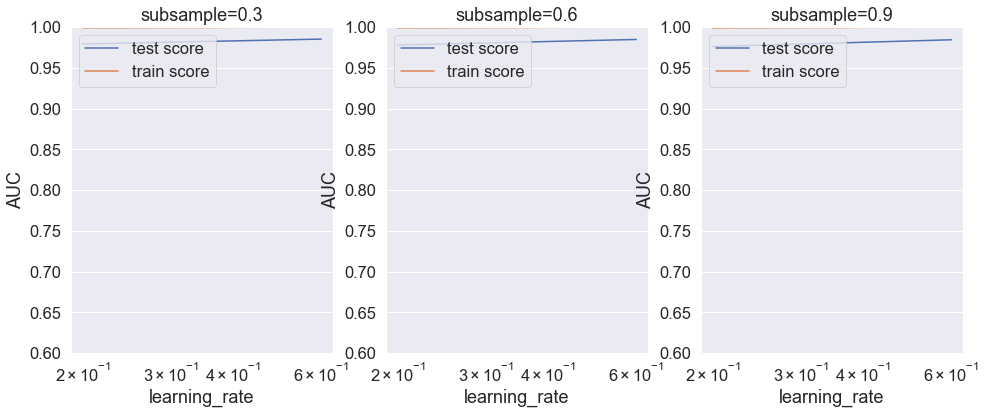

In [450]:
# # plotting
plt.figure(figsize=(16,6))

param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]} 


for n, subsample in enumerate(param_grid['subsample']):
    

    # subplot 1/n
    plt.subplot(1,len(param_grid['subsample']), n+1)
    df = cv_results[cv_results['param_subsample']==subsample]

    plt.plot(df["param_learning_rate"], df["mean_test_score"])
    plt.plot(df["param_learning_rate"], df["mean_train_score"])
    plt.xlabel('learning_rate')
    plt.ylabel('AUC')
    plt.title("subsample={0}".format(subsample))
    plt.ylim([0.60, 1])
    plt.legend(['test score', 'train score'], loc='upper left')
    plt.xscale('log')

In [451]:
model_cv.best_params_

{'learning_rate': 0.6, 'subsample': 0.3}

In [452]:
# chosen hyperparameters

params = {'learning_rate': 0.6,
          'max_depth': 2, 
          'n_estimators':200,
          'subsample':0.3,
         'objective':'binary:logistic'}

# fit model on training data
xgb_bal_adasyn_model = XGBClassifier(params = params)
xgb_bal_adasyn_model.fit(X_train_adasyn, y_train_adasyn)

[22:31:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "params" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:31:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1,
              params={'learning_rate': 0.6, 'max_depth': 2, 'n_estimators': 200,
                      'objective': 'binary:logistic', 'subsample': 0.3},
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)

##### Prediction on the train set

In [453]:
# Predictions on the train set
y_train_pred = xgb_bal_adasyn_model.predict(X_train_adasyn)

In [454]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_train_adasyn, y_train_adasyn)
print(confusion)

[[219788      0]
 [     0 219750]]


In [455]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [456]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_train_adasyn, y_train_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_train_adasyn, y_train_pred))

Accuracy:- 0.999993174651566
Sensitivity:- 1.0
Specificity:- 1.0
F1-Score:- 0.9999931741080265


In [457]:
# classification_report
print(classification_report(y_train_adasyn, y_train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    219788
           1       1.00      1.00      1.00    219750

    accuracy                           1.00    439538
   macro avg       1.00      1.00      1.00    439538
weighted avg       1.00      1.00      1.00    439538



In [458]:
# Predicted probability
y_train_pred_proba = xgb_bal_adasyn_model.predict_proba(X_train_adasyn)[:,1]

In [459]:
# roc_auc
auc = metrics.roc_auc_score(y_train_adasyn, y_train_pred_proba)
auc

1.0

In [469]:
print('Train auc =', metrics.roc_auc_score(y_train_adasyn, y_train_pred_proba))
fpr, tpr, thresholds = metrics.roc_curve(y_train_adasyn, y_train_pred_proba)
threshold = thresholds[np.argmax(tpr-fpr)]
print("Threshold=",threshold)

Train auc = 1.0
Threshold= 0.87872046


--------

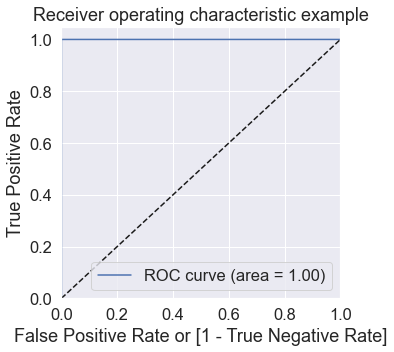

In [460]:
# Plot the ROC curve
draw_roc(y_train_adasyn, y_train_pred_proba)

##### Prediction on the test set

In [461]:
# Predictions on the test set
y_test_pred = xgb_bal_adasyn_model.predict(X_test)

In [462]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion)

[[54915    41]
 [   13    75]]


In [463]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [464]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

# F1 score
print("F1-Score:-", f1_score(y_test, y_test_pred))

Accuracy:- 0.9990189666448659
Sensitivity:- 0.8522727272727273
Specificity:- 0.9992539486134362
F1-Score:- 0.7352941176470589


In [465]:
# classification_report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     54956
           1       0.65      0.85      0.74        88

    accuracy                           1.00     55044
   macro avg       0.82      0.93      0.87     55044
weighted avg       1.00      1.00      1.00     55044



In [466]:
# Predicted probability
y_test_pred_proba = xgb_bal_adasyn_model.predict_proba(X_test)[:,1]

In [467]:
# roc_auc
auc = metrics.roc_auc_score(y_test, y_test_pred_proba)
auc

0.9821305391420575

In [472]:
print('Test auc =', metrics.roc_auc_score(y_test, y_test_pred_proba))
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_test_pred_proba)
threshold = thresholds[np.argmax(tpr-fpr)]
print("Threshold =",threshold)

Test auc = 0.9821305391420575
Threshold = 0.0035628069


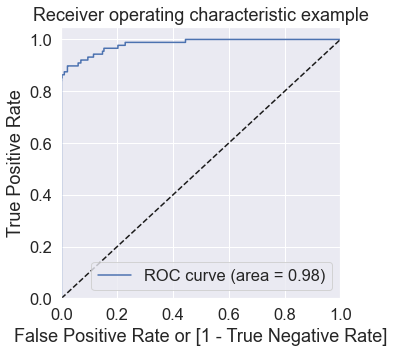

In [468]:
# Plot the ROC curve
draw_roc(y_test, y_test_pred_proba)

### Choosing best model on the balanced data

He we balanced the data with various approach such as Undersampling, Oversampling, SMOTE and Adasy. With every data balancing thechnique we built several models such as Logistic, XGBoost, Decision Tree, and Random Forest.

We can see that almost all the models performed more or less good. But we should be interested in the best model. 

Though the Undersampling technique models performed well, we should keep mind that by doing the undersampling some imformation were lost. Hence, it is better not to consider the undersampling models.

Whereas the SMOTE and Adasyn models performed well. Among those models the simplist model Logistic regression has ROC score 0.99 in the train set and 0.97 on the test set. We can consider the Logistic model as the best model to choose because of the easy interpretation of the models and also the resourse requirements to build the mdoel is lesser than the other heavy models such as Random forest or XGBoost.

Hence, we can conclude that the `Logistic regression model with SMOTE` is the best model for its simlicity and less resource requirement. 